# Imports

In [5]:
#!/usr/bin/env python3
# -*- coding: utf-8 -*-
"""
@author: pho
"""
%load_ext autoreload
%autoreload 2
import sys
import importlib
from threading import Thread
import time # for time.sleep
from ipygany import PolyMesh, Scene, IsoColor, WarpByScalar
import pyvista as pv
# from pyvista import _vtk
import pyvistaqt as pvqt
import colorcet as cc # Colormaps:
import numpy as np
import pandas as pd
import h5py
import hdf5storage # conda install hdf5storage
from pathlib import Path
import bqplot.scales
import seaborn as sns

#interactive plotting in separate window
# %matplotlib qt
%matplotlib inline
# %matplotlib notebook
# %matplotlib widget
# %matplotlib qt

from mpl_toolkits import mplot3d
# %matplotlib widget
import matplotlib.pyplot as plt
import matplotlib.cm as cm
from matplotlib.colors import Normalize, to_rgba_array
from matplotlib.figure import Figure
# import mplcursors
import math # For color map generation
from matplotlib.colors import ListedColormap
from matplotlib.cm import hsv

from copy import deepcopy

import ipywidgets as widgets
# from PyQt5 import QtWidgets, uic
from pyvistaqt import QtInteractor, MainWindow
# from pyqt6 import QApplication
from IPython.external.qt_for_kernel import QtGui
from PyQt5.QtWidgets import QApplication
import datetime as dt

import panel as pn
from panel.interact import interact, interactive, fixed, interact_manual
from panel import widgets
pn.extension()
# pn.extension('tabulator')



The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [6]:
# NeuroPy (Diba Lab Python Repo) Loading
try:
    from neuropy import core
    importlib.reload(core)
except ImportError:
    sys.path.append(r'C:\Users\Pho\repos\NeuroPy') # Windows
    # sys.path.append('/home/pho/repo/BapunAnalysis2021/NeuroPy') # Linux
    # sys.path.append(r'/Users/pho/repo/Python Projects/NeuroPy') # MacOS
    print('neuropy module not found, adding directory to sys.path. \n >> Updated sys.path.')
    from neuropy import core
# from neuropy.core.session.dataSession import SessionConfig, DataSessionLoader, DataSession, processDataSssion

# import neuropy.core as core
from neuropy.core.session.data_session_loader import DataSessionLoader
from neuropy.core.session.dataSession import DataSession
from neuropy.core.epoch import Epoch
from neuropy.core.epoch import NamedTimerange
from neuropy.core import Laps
from neuropy.core import Position
from neuropy.core import FlattenedSpiketrains
from neuropy.core import Neurons
from neuropy.utils.misc import print_seconds_human_readable
from neuropy.plotting import plot_raster
from neuropy.analyses.placefields import PlacefieldComputationParameters

In [7]:
# import PhoPositionalData as pdp
# from PhoPositionalData import load_exported, process_data
from PhoPositionalData.load_exported import *
# from PhoPositionalData.process_data import process_positionalAnalysis_data, gen_2d_histrogram, get_heatmap_color_vectors, process_chunk_equal_poritions_data, extract_spike_timeseries
from PhoPositionalData.process_data import *
from PhoPositionalData.plot_data import *
from PhoPositionalData.plotting.animations import * # make_mp4_from_plotter
from PhoPositionalData.import_data import * # build_spike_positions_list, build_cellID_reverse_lookup_map
from PhoPositionalData.analysis.interactive_placeCell_config import InteractivePlaceCellConfig, VideoOutputModeConfig, PlottingConfig
from PhoPositionalData.analysis.interactive_placeCell_config import print_subsession_neuron_differences


from PendingNotebookCode import debug_print_spike_counts, compute_placefields_as_needed, build_configs, build_units_colormap, build_placefield_multiplotter, process_by_good_placefields

In [8]:
# import zetapy
# # from PhoPositionalData.zetapy import zetapy
# # import PhoPositionalData.EXTERNAL.zetapy 
# # r'C:\Users\Pho\repos\zetapy'

# from zetapy.example import runExampleZETA

# Load Session Data

In [9]:
# KDiba Old Format:
## Data must be pre-processed using the MATLAB script located here: 
# R:\data\KDIBA\gor01\one\IIDataMat_Export_ToPython_2021_11_23.m
# From pre-computed .mat files:
# 07: 
basedir = r'R:\data\KDIBA\gor01\one\2006-6-07_11-26-53'
# # ## 08:
# basedir = r'R:\data\KDIBA\gor01\one\2006-6-08_14-26-15'
sess = DataSessionLoader.kdiba_old_format_session(basedir)
active_sess_config = sess.config
session_name = sess.name

	 basepath: R:\data\KDIBA\gor01\one\2006-6-07_11-26-53
	 session_name: 2006-6-07_11-26-53
Loading matlab import file: R:\data\KDIBA\gor01\one\2006-6-07_11-26-53\2006-6-07_11-26-53.epochs_info.mat...
done.
Loading matlab import file: R:\data\KDIBA\gor01\one\2006-6-07_11-26-53\2006-6-07_11-26-53.position_info.mat...
done.
Loading matlab import file: R:\data\KDIBA\gor01\one\2006-6-07_11-26-53\2006-6-07_11-26-53.spikes.mat...
done.
Failure loading .position.npy. Must recompute.

Computing linear positions for all active epochs for session...
curr_active_epoch_timeslice_indicies: Int64Index([   27,    28,    29,    30,    31,    32,    33,    34,    35,
               36,
            ...
            52139, 52140, 52141, 52142, 52143, 52144, 52145, 52146, 52147,
            52148],
           dtype='int64', length=52122)
 	 np.shape(curr_active_epoch_timeslice_indicies): (52122,)
curr_active_epoch_timeslice_indicies: Int64Index([52149, 52150, 52151, 52152, 52153, 52154, 52155, 52156, 52157,


### Debugging

In [ ]:
# sess.spikes_df.size # (1014937, 18)
# np.sum(sess.neurons.n_spikes) # 1014937
print('session dataframe spikes: {}\n session.neurons.n_spikes summed: {}\n'.format(sess.spikes_df.shape, np.sum(sess.neurons.n_spikes)))

In [ ]:
# debug_print_spike_counts(sess)

# sess.spikes_df unique aclu values: [ 2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25
#  26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48 49
#  50 51 52 53 54 55 56 57 58 59 60 61 62 63 64 65]
# sess.spikes_df unique aclu value counts: [    0     0  1707  1359   554  3066 91337  2707   294  2991   913  1278
#   1221  5475  2880 36760 48449   523  2595  3025 34729  3958  5263   790
#    663  1070  1078  2954  4044  2581 73951  4871 13444   476  1234 89854
#   5822 14961  2682  1184 13575 83972   795 22769  1559  8307  2098   438
#   3476 28370 43854  1355  2552  2875 59011  1440 75786  3656   875 17727
#  77247   550   408  2627  1734  2799]

# sess.spikes_df unique unit_id values: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
#  24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
#  48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]
# sess.spikes_df unique unit_id value counts: [ 1707  1359   554  3066 91337  2707   294  2991   913  1278  1221  5475
#   2880 36760 48449   523  2595  3025 34729  3958  5263   790   663  1070
#   1078  2954  4044  2581 73951  4871 13444   476  1234 89854  5822 14961
#   2682  1184 13575 83972   795 22769  1559  8307  2098   438  3476 28370
#  43854  1355  2552  2875 59011  1440 75786  3656   875 17727 77247   550
#    408  2627  1734  2799]

# sess.neurons.spiketrains
# sess.neurons.n_spikes

## Note the unit_id seems to have valid spikes for all of them, while the aclu does not!
sess.spikes_df # 1014937

sess.laps
# np.where(np.logical_and((sess.spikes_df.maze_relative_lap == 1), (sess.spikes_df.maze_id == 2)))
# sess.spikes_df.lap.values[np.logical_and((sess.spikes_df.maze_relative_lap == 1), (sess.spikes_df.lap_maze == 2))]


# test_df = sess.spikes_df
# test_df


# laps_epoch = Epoch(sess.laps.to_dataframe())
# laps_epoch.to_dataframe()


In [ ]:
lap_specific_subsessions = list()
lap_grouped_spikes_df = sess.spikes_df.groupby(['lap']) #  as_index=False keeps the original index

In [ ]:
i = 2
curr_lap_id = sess.laps.lap_id[i]
curr_lap_times = sess.laps.get_lap_times(i)
print('curr_lap_id: {}'.format(curr_lap_id))
print('curr_lap_times: {}'.format(curr_lap_times))

lap_specific_subsessions.append(sess.time_slice(curr_lap_times[0], curr_lap_times[-1]))
# lap_specific_subsessions.append(sess.time_slice(curr_lap_dataframe.t_seconds.values[0], curr_lap_dataframe.t_seconds.values[-1]))

In [ ]:
i = 3
curr_lap_id = sess.laps.lap_id[i]
curr_lap_times = sess.laps.get_lap_times(i)
print('curr_lap_id: {}'.format(curr_lap_id))
print('curr_lap_times: {}'.format(curr_lap_times))

lap_specific_subsessions.append(sess.time_slice(curr_lap_times[0], curr_lap_times[-1]))

In [ ]:
lap_specific_session = DataSession.concat(lap_specific_subsessions)
lap_specific_session

In [ ]:
lap_specific_session.neurons.n_spikes # this looks right.

lap_specific_session.position.print_debug_str() # this looks right.

# len(sess.neurons.n_spikes) # 64 items long
# sess.neurons.n_spikes
# array([ 1707,  1359,   554,  3066, 91337,  2707,   294,  2991,   913,
#         1278,  1221,  5475,  2880, 36760, 48449,   523,  2595,  3025,
#        34729,  3958,  5263,   790,   663,  1070,  1078,  2954,  4044,
#         2581, 73951,  4871, 13444,   476,  1234, 89854,  5822, 14961,
#         2682,  1184, 13575, 83972,   795, 22769,  1559,  8307,  2098,
#          438,  3476, 28370, 43854,  1355,  2552,  2875, 59011,  1440,
#        75786,  3656,   875, 17727, 77247,   550,   408,  2627,  1734,
#         2799])



## Laps: Create version of Session that only includes activity during the laps

In [10]:
lap_specific_epochs = sess.laps.as_epoch_obj()
# lap_specific_epochs.to_dataframe()
even_lap_sp1ecific_epochs = lap_specific_epochs.label_slice(lap_specific_epochs.labels[np.arange(0, len(sess.laps.lap_id), 2)])
odd_lap_specific_epochs = lap_specific_epochs.label_slice(lap_specific_epochs.labels[np.arange(1, len(sess.laps.lap_id), 2)])
# odd_lap_specific_epochs

# even_lap_specific_session = [lap_specific_sessions[i] for i in np.arange(0, len(sess.laps.lap_id), 2)]
# odd_lap_specific_session = [lap_specific_sessions[i] for i in np.arange(1, len(lap_specific_sessions), 2)]
# even_lap_specific_session
# range(0, 2, len(lap_specific_sessions))

### Lap Specific Session Debugging

In [ ]:
sess.laps.lap_id # 1-80

In [ ]:
sess.laps.to_dataframe()

In [ ]:
lap_specific_session.flattened_spiketrains

In [ ]:
# lap_specific_session.position
# sess.neurons.spiketrains
sess.flattened_spiketrains.spikes_df

In [ ]:
sess.flattened_spiketrains.spikes_df
neurons_obj = Neurons.from_dataframe(sess.flattened_spiketrains.spikes_df, sess.recinfo.dat_sampling_rate, time_variable_name='t_rel_seconds')
neurons_obj

In [ ]:
## Filtering Testing:
temp_spikes_df = deepcopy(sess.flattened_spiketrains.spikes_df)
curr_lap_spikes_df = temp_spikes_df.loc[temp_spikes_df['lap'] != -1]
curr_lap_spikes_neurons_obj = Neurons.from_dataframe(curr_lap_spikes_df, sess.recinfo.dat_sampling_rate, time_variable_name='t_rel_seconds')
print_subsession_neuron_differences(sess.neurons, curr_lap_spikes_neurons_obj)
# Asign the result to the lap_specific_session
lap_specific_session.flattened_spiketrains = FlattenedSpiketrains(curr_lap_spikes_df, time_variable_name='t_rel_seconds', t_start=0.0)
lap_specific_session.neurons = curr_lap_spikes_neurons_obj

# Filter Session by Epoch:

In [10]:
sess.epochs.t_start = 22.26 # exclude the first short period where the animal isn't on the maze yet
# sess.epochs.to_dataframe()
active_epoch = sess.epochs.get_named_timerange('maze1')
# print('active_epoch: {}'.format(active_epoch))
# active_epoch = sess.epochs.get_named_timerange('maze2')
# active_epoch = NamedTimerange(name='maze', start_end_times=[sess.epochs['maze1'][0], sess.epochs['maze2'][1]])
active_subplots_shape = (1,1) # Single subplot
# active_subplots_shape = '1|2' # 1 subplot on left, two on right                                                   
active_config = build_configs(active_sess_config, active_epoch, active_subplots_shape = active_subplots_shape)

## All Spikes:
active_epoch_session = sess.filtered_by_neuron_type('pyramidal').filtered_by_epoch(active_epoch)
print_subsession_neuron_differences(sess.neurons, active_epoch_session.neurons)
# print(sess.neurons.n_spikes)

# # ## Lap_specific Spikes Only:
# active_lap_specific_epoch_session = lap_specific_session.filtered_by_neuron_type('pyramidal').filtered_by_epoch(active_epoch)
# print_subsession_neuron_differences(lap_specific_session.neurons, active_lap_specific_epoch_session.neurons)
# # print(active_lap_specific_epoch_session.neurons.n_spikes)

## Configure Placefield Calc:
should_display_2D_plots = True

# active_config.computation_config = PlacefieldComputationParameters(speed_thresh=1, grid_bin=2, smooth=0.5, frate_thresh=2.0)
# active_config.computation_config = PlacefieldComputationParameters(speed_thresh=1, grid_bin=10, smooth=0.5, frate_thresh=2.0) # works well
# active_config.computation_config = PlacefieldComputationParameters(speed_thresh=1, grid_bin=2.5, smooth=1.5, frate_thresh=2.0)
# active_config.computation_config = PlacefieldComputationParameters(speed_thresh=1, grid_bin=(10, 3), smooth=(0.5, 0.5), frate_thresh=0.0)
active_config.computation_config = PlacefieldComputationParameters(speed_thresh=0.1, grid_bin=(3, 4), smooth=(2, 1), frate_thresh=2.0)
# active_config.computation_config = PlacefieldComputationParameters(speed_thresh=1, grid_bin=(10, 10), smooth=(0.5, 0.5), frate_thresh=2.0) ## Works well for 2D Placemaps
# height: 20.0
# width: 250.0
# active_config.computation_config = PlacefieldComputationParameters(speed_thresh=0, grid_bin=(2.0, 0.2), smooth=(0.5, 0.5), frate_thresh=2.0) ## Extremely Slow
# active_config.computation_config = PlacefieldComputationParameters(speed_thresh=0, grid_bin=(2.0, 1.0), smooth=(0.5, 0.5), frate_thresh=2.0) ## Very slow, doesn't work

# active_config.computation_config = PlacefieldComputationParameters(speed_thresh=1, grid_bin=(10, 3), smooth=(0.0, 0.0), frate_thresh=2.0)
# active_config.computation_config = PlacefieldComputationParameters(speed_thresh=1, grid_bin=(10, 3), smooth=(0.1, 0.1), frate_thresh=2.0)
# active_config.computation_config = PlacefieldComputationParameters(speed_thresh=1, grid_bin=(10, 3), smooth=(1.0, 10.0), frate_thresh=2.0)

# active_config.computation_config.frate_thresh = 0.0

Constraining to units with type: pyramidal
Constraining to epoch with times (start: 22.26, end: 1739.1533641185379)
69142/932598 total spikes spanning 40/64 units remain in subsession


## Compute Placefields if needed:

Recomputing active_epoch_placefields...
traces accessed with self.ndim of 1
	 done.
Recomputing active_epoch_placefields2D...
	 done.
Saving 1D Placefield image out to "output\2006-6-07_11-26-53\maze1\speedThresh_0.10-gridBin_3.00_4.00-smooth_2.00_1.00-frateThresh_2.00\pf1D-Placefield1D-maze1-speedThresh_0.10-gridBin_3.00-smooth_2.00-frateThresh_2.png"...
	 done.
Saving 2D Placefield image out to "output\2006-6-07_11-26-53\maze1\speedThresh_0.10-gridBin_3.00_4.00-smooth_2.00_1.00-frateThresh_2.00\pf2D-Occupancy -maze1-speedThresh_0.10-gridBin_3.00_4.00-smooth_2.00_1.00-frateThresh_2.png"...
	 done.
Saving 2D Placefield image out to "output\2006-6-07_11-26-53\maze1\speedThresh_0.10-gridBin_3.00_4.00-smooth_2.00_1.00-frateThresh_2.00\pf2D-Placefields-maze1-speedThresh_0.10-gridBin_3.00_4.00-smooth_2.00_1.00-frateThresh_2.png"...
	 done.
good_placefield_neuronIDs: [ 2  3  4  5  7  8  9 10 11 12 14 17 18 21 22 23 24 25 26 27 28 29 33 38
 39 44 45 46 47 48 53 55 57 61 63 64]; (36 good)
acti

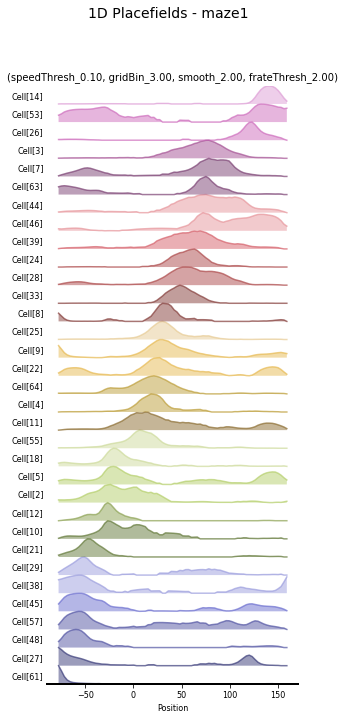

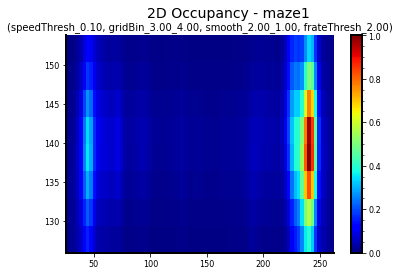

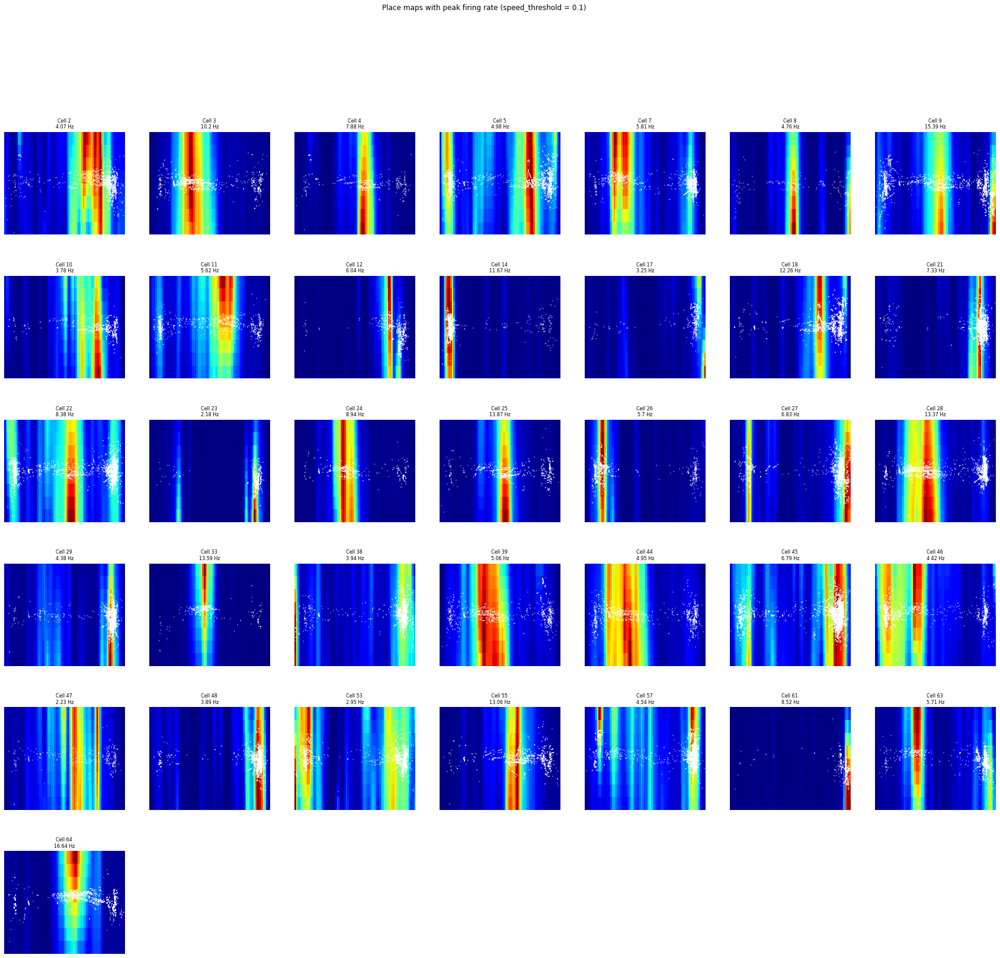

In [11]:
try: active_epoch_placefields1D
except NameError: active_epoch_placefields1D = None # Checks variable active_epoch_placefields's existance, and sets its value to None if it doesn't exist so it can be checked in the next step
try: active_epoch_placefields2D
except NameError: active_epoch_placefields2D = None # Checks variable active_epoch_placefields's existance, and sets its value to None if it doesn't exist so it can be checked in the next step
# active_config.computation_config.smooth = (1.5, 0.5)
active_epoch_placefields1D, active_epoch_placefields2D = compute_placefields_as_needed(active_epoch_session, active_config.computation_config, active_config, active_epoch_placefields1D, active_epoch_placefields2D, included_epochs=None, should_force_recompute_placefields=True, should_display_2D_plots=should_display_2D_plots)
# Focus on the 2D placefields:
active_epoch_placefields = active_epoch_placefields2D
# Get the updated session using the units that have good placefields
active_epoch_session, active_config, good_placefield_neuronIDs = process_by_good_placefields(active_epoch_session, active_config, active_epoch_placefields)
debug_print_spike_counts(active_epoch_session)

## Compute the placefields for lap-only filtered Session:

Recomputing active_epoch_placefields...
traces accessed with self.ndim of 1
	 done.
Recomputing active_epoch_placefields2D...


C:\Users\Pho\repos\NeuroPy\neuropy\analyses\placefields.py:369: RuntimeWarning: invalid value encountered in true_divide
  tuning_map = tuning_map / occupancy


	 done.
Saving 1D Placefield image out to "output\2006-6-07_11-26-53\maze1\speedThresh_0.10-gridBin_3.00_4.00-smooth_2.00_1.00-frateThresh_2.00\pf1D-Placefield1D-maze1-speedThresh_0.10-gridBin_3.00-smooth_2.00-frateThresh_2.png"...
	 done.
Saving 2D Placefield image out to "output\2006-6-07_11-26-53\maze1\speedThresh_0.10-gridBin_3.00_4.00-smooth_2.00_1.00-frateThresh_2.00\pf2D-Occupancy -maze1-speedThresh_0.10-gridBin_3.00_4.00-smooth_2.00_1.00-frateThresh_2.png"...
	 done.
Saving 2D Placefield image out to "output\2006-6-07_11-26-53\maze1\speedThresh_0.10-gridBin_3.00_4.00-smooth_2.00_1.00-frateThresh_2.00\pf2D-Placefields-maze1-speedThresh_0.10-gridBin_3.00_4.00-smooth_2.00_1.00-frateThresh_2.png"...
	 done.


NameError: name 'active_lap_specific_epoch_session' is not defined

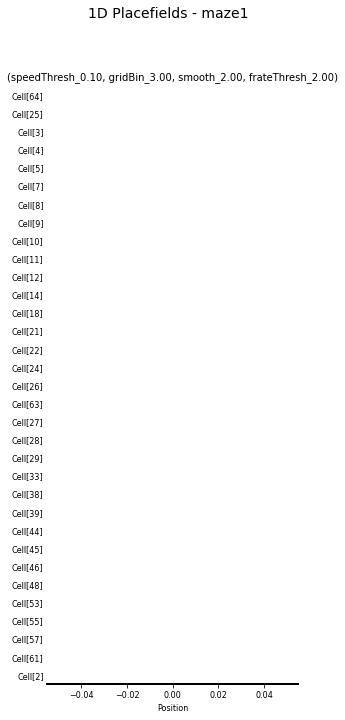

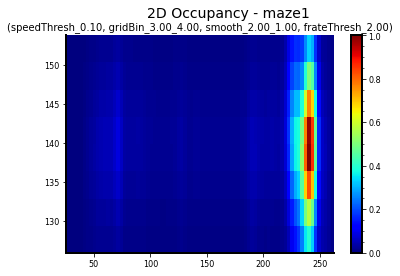

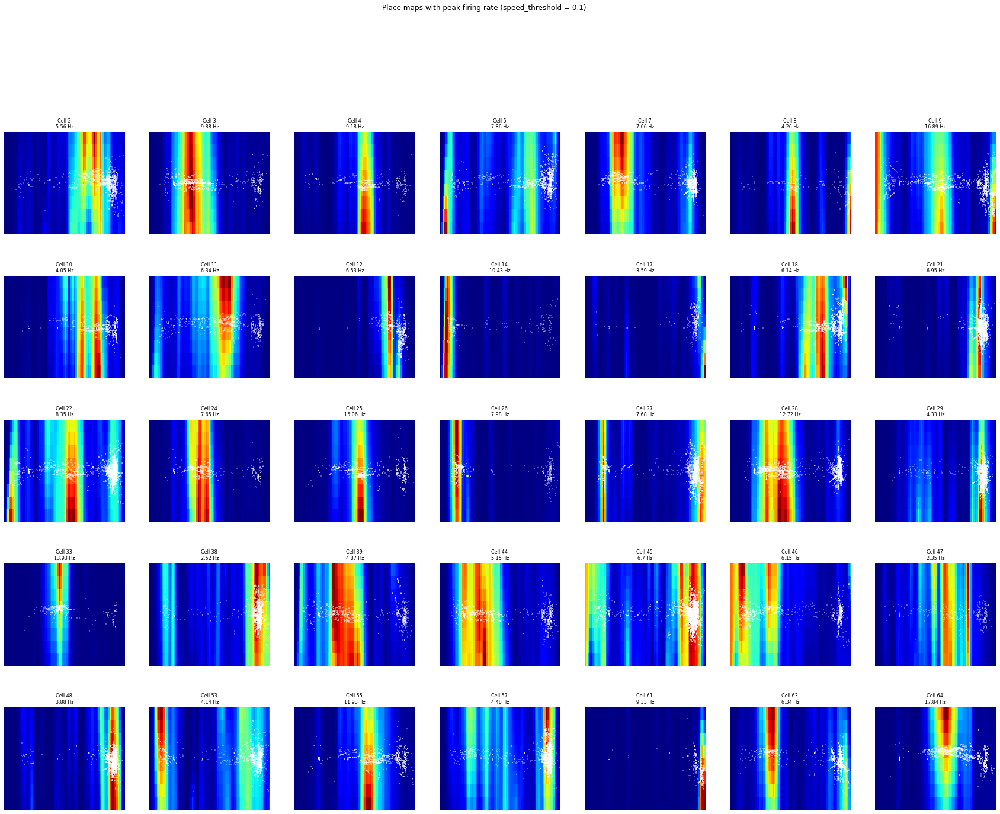

In [12]:
try: active_lap_only_placefields1D
except NameError: active_lap_only_placefields1D = None # Checks variable active_epoch_placefields's existance, and sets its value to None if it doesn't exist so it can be checked in the next step
try: active_lap_only_placefields2D
except NameError: active_lap_only_placefields2D = None # Checks variable active_epoch_placefields's existance, and sets its value to None if it doesn't exist so it can be checked in the next step
lap_specific_config = active_config
# lap_specific_included_epochs = Epoch(sess.laps.to_dataframe())
# lap_specific_included_epochs = even_lap_specific_epochs # Kamran Right
lap_specific_included_epochs = odd_lap_specific_epochs
# active_lap_only_placefields1D, active_lap_only_placefields2D = compute_placefields_as_needed(active_lap_specific_epoch_session, lap_specific_config.computation_config, lap_specific_config, active_lap_only_placefields1D, active_lap_only_placefields2D, should_force_recompute_placefields=True, should_display_2D_plots=True)
active_lap_only_placefields1D, active_lap_only_placefields2D = compute_placefields_as_needed(active_epoch_session, lap_specific_config.computation_config, lap_specific_config, active_lap_only_placefields1D, active_lap_only_placefields2D, included_epochs=lap_specific_included_epochs, should_force_recompute_placefields=True, should_display_2D_plots=should_display_2D_plots)

# Focus on the 2D placefields:
active_lap_only_placefields = active_lap_only_placefields2D
# Get the updated session using the units that have good placefields
lap_specific_session, lap_specific_config, lap_specific_good_placefield_neuronIDs = process_by_good_placefields(active_lap_specific_epoch_session, lap_specific_config, active_lap_only_placefields)

# Pho Custom Placefield2D Implementation:


C:\Users\Pho\AppData\Local\Temp/ipykernel_7056/440955658.py:72: RuntimeWarning: invalid value encountered in true_divide
  spike_rate_Hz_map = num_spike_counts_map / seconds_occupancy
C:\Users\Pho\AppData\Local\Temp/ipykernel_7056/440955658.py:83: RuntimeWarning: invalid value encountered in true_divide
  tuning_maps = np.asarray([raw_tuning_maps[i] / occupancy for i in np.arange(len(raw_tuning_maps))])


Column
    [0] Column
        [0] FloatSlider(end=20.0, name='speed_thresh', step=1.0, value=1)
        [1] FloatSlider(end=20.0, name='grid_bin_x', start=0.1, step=0.5, value=10)
        [2] FloatSlider(end=20.0, name='grid_bin_y', start=0.1, step=0.5, value=3)
        [3] FloatSlider(end=20.0, name='smooth_x', step=0.25)
        [4] FloatSlider(end=20.0, name='smooth_y', step=0.25)
        [5] FloatSlider(end=20.0, name='frate_thresh', step=1.0)
    [1] Row
        [0] Matplotlib(Figure, name='interactive00102')
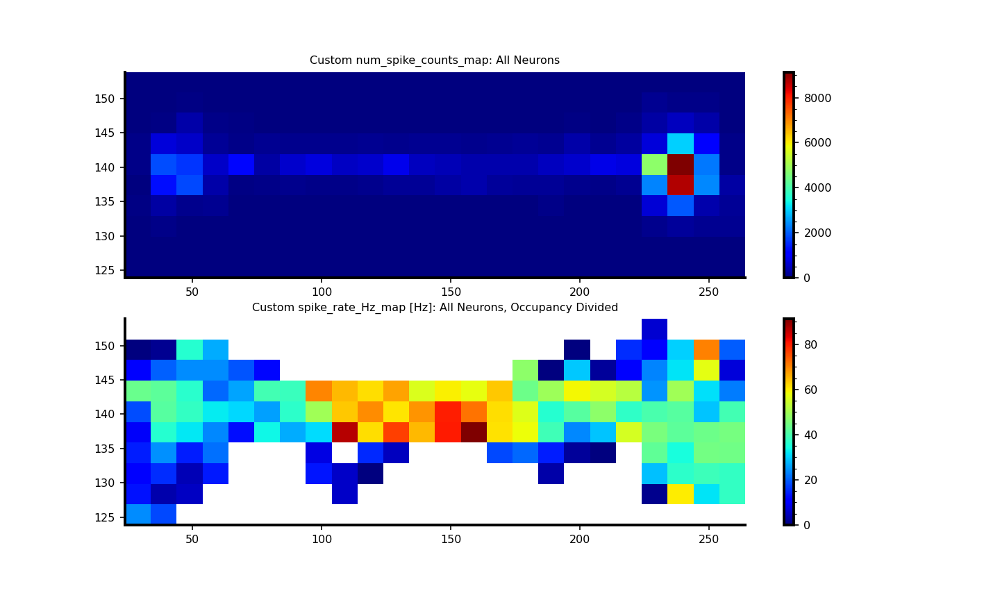

In [13]:
from neuropy.analyses.placefields import _bin_pos, plot_placefield_occupancy, plot_occupancy_custom, _filter_by_frate, Pf2D, _normalized_occupancy

from neuropy.core.ratemap import Ratemap

# First, interested in answering the question "where did the animal spend its time on the track" to assess the relative frequency of events that occur in a given region. If the animal spends a lot of time in a certain region,
# it's more likely that any cell, not just the ones that hold it as a valid place field, will fire there.
    # this can be done by either binning (lumping close position points together based on a standardized grid), neighborhooding, or continuous smearing. 

def build_customPf2D_fromConfig(active_epoch_session, custom_computation_config):
    # num_bins = (10, 10)
    fig = Figure(figsize=(10, 6))
    ax = fig.subplots(2, 1)
    
    should_plot_multiple_occupancy_curves = False
    
    pos_df = active_epoch_session.position.to_dataframe().copy()
    laps_df = active_epoch_session.laps.to_dataframe().copy()
    spk_df = active_epoch_session.spikes_df.copy()

    ## Binning with Fixed Number of Bins:    
    xbin, ybin, bin_info = _bin_pos(pos_df.x.to_numpy(), pos_df.y.to_numpy(), bin_size=custom_computation_config.grid_bin) # bin_size mode
    # print(bin_info)
    ## Binning with Fixed Bin Sizes:
    # xbin, ybin, bin_info = _bin_pos(pos_df.x.to_numpy(), pos_df.y.to_numpy(), num_bins=num_bins) # num_bins mode
    # print(bin_info)

    # print('xbin: {}'.format(xbin))
    # print('ybin: {}'.format(ybin))

    # # Laps plotting:
    # # pos_df.lin_pos.plot();
    # curr_lap_id = 3
    # plt.plot(pos_df.t, pos_df.lin_pos, '*');
    # plt.xlim([laps_df.start[curr_lap_id], laps_df.stop[curr_lap_id]])
    # # pos_df.describe()
    # # pos_df.boxplot()

    raw_occupancy, xedges, yedges = Pf2D._compute_occupancy(pos_df.x.to_numpy(), pos_df.y.to_numpy(), xbin, ybin, active_epoch_session.position.sampling_rate, custom_computation_config.smooth, should_return_raw_occupancy=True)
    seconds_occupancy, normalized_occupancy = _normalized_occupancy(raw_occupancy, position_srate=active_epoch_session.position.sampling_rate)
    occupancy = seconds_occupancy
    # print(np.shape(occupancy))
    # print(occupancy)
    # plot_occupancy(occupancy)
    # plot_occupancy_custom(active_epoch_placefields2D)

    if should_plot_multiple_occupancy_curves:
        fig, ax = plot_occupancy_custom(raw_occupancy, xedges, yedges, max_normalized=False)
        ax.set_title('Custom Occupancy: Raw')
        fig, ax = plot_occupancy_custom(normalized_occupancy, xedges, yedges, max_normalized=False)
        ax.set_title('Custom Occupancy: Normalized')
        fig, ax = plot_occupancy_custom(seconds_occupancy, xedges, yedges, max_normalized=False)
        ax.set_title('Custom Occupancy: Seconds')

    # pos_df.groupby('lap').plas.hist(alpha=0.4)

    # Given a cell's last several seconds of its instantaneous firing rate at a given point in time, what's like likelihood that it's at a given position.
        # continuous position used.

    # spk_df_filtered_speed_thresh = spk_df[spk_df['speed'] >= custom_computation_config.speed_thresh].copy() # filter out the spikes below the speed_threshold
    # spk_x = spk_df_filtered_speed_thresh['x'].to_numpy()
    # spk_y = spk_df_filtered_speed_thresh['y'].to_numpy()

    spk_x = spk_df['x'].to_numpy()
    spk_y = spk_df['y'].to_numpy()
    num_spike_counts_map = Pf2D._compute_tuning_map(spk_x, spk_y, xbin, ybin, occupancy, custom_computation_config.smooth, should_return_raw_tuning_map=True)
    fig, ax[0] = plot_occupancy_custom(num_spike_counts_map, xbin, ybin, max_normalized=False, fig=fig, ax=ax[0])
    ax[0].set_title('Custom num_spike_counts_map: All Neurons')

    mpl_pane = pn.pane.Matplotlib(fig, dpi=144, height=800)
    tabs = pn.Tabs(('num_spike_counts_map', fig))
    ## This seems to be wrong, the highest spike rate is like 0.1 (in Hz)
    spike_rate_Hz_map = num_spike_counts_map / seconds_occupancy
    fig, ax[1] = plot_occupancy_custom(spike_rate_Hz_map, xbin, ybin, max_normalized=False, fig=fig, ax=ax[1])
    ax[1].set_title('Custom spike_rate_Hz_map [Hz]: All Neurons, Occupancy Divided')
    # Add a tab
    tabs.append(('spike_rate_Hz_map', fig))

    # # Add a tab
    # tabs.append(('Slider', pn.widgets.FloatSlider()))

    neuron_split_spike_dfs = [spk_df.groupby('aclu').get_group(neuron_id)[['t','x','y','lin_pos']] for neuron_id in active_epoch_session.neuron_ids] # dataframes split for each ID:
    raw_tuning_maps = np.asarray([Pf2D._compute_tuning_map(neuron_split_spike_dfs[i].x.to_numpy(), neuron_split_spike_dfs[i].y.to_numpy(), xbin, ybin, occupancy, custom_computation_config.smooth, should_return_raw_tuning_map=True) for i in np.arange(len(neuron_split_spike_dfs))]) # dataframes split for each ID:
    tuning_maps = np.asarray([raw_tuning_maps[i] / occupancy for i in np.arange(len(raw_tuning_maps))])
    ratemap = Ratemap(tuning_maps, xbin=xbin, ybin=ybin, neuron_ids=active_epoch_session.neuron_ids)

    # fig, ax = plot_occupancy_custom(raw_tuning_maps[0], xedges, yedges, max_normalized=False)
    # ax.set_title('Custom raw_tuning_maps: Seconds')
    firing_spike_counts_max = np.asarray([np.nanmax(raw_tuning_maps[i]) for i in np.arange(len(neuron_split_spike_dfs))]) # dataframes split for each ID:
    # print('firing_spike_counts_max: {}'.format(firing_spike_counts_max))
    firing_rate_max = np.asarray([np.nanmax(tuning_maps[i]) for i in np.arange(len(neuron_split_spike_dfs))]) # dataframes split for each ID:
    # print('firing_rate_max: {}'.format(firing_rate_max))

    filtered_tuning_maps, filter_function = _filter_by_frate(tuning_maps.copy(), custom_computation_config.frate_thresh)
    filtered_ratemap = Ratemap(filtered_tuning_maps, xbin=xbin, ybin=ybin, neuron_ids=filter_function(ratemap.neuron_ids))
    
    # outputs: filtered_ratemap, filtered_ratemap
    
    # plt.fastcolor(active_epoch_placefields1D.occupancy)
    # Convolve the location data

    # plot_occupancy(active_epoch_placefields2D)
    # pn.pane.Matplotlib(fig)
    
    return fig

def build_customPf2D(active_epoch_session, speed_thresh=1, grid_bin=(10, 3), smooth=(0.0, 0.0), frate_thresh=0.0):
    # custom_active_config = active_config
    # note the second smoothing paramter affects the horizontal axis on the occupancy plot:
    # custom_computation_config = PlacefieldComputationParameters(speed_thresh=1, grid_bin=(10, 3), smooth=(2, 0.1), frate_thresh=0.0)
    # custom_computation_config = PlacefieldComputationParameters(speed_thresh=1, grid_bin=(10, 3), smooth=(0.0, 0.0), frate_thresh=0.0)
    custom_computation_config = PlacefieldComputationParameters(speed_thresh=speed_thresh, grid_bin=grid_bin, smooth=smooth, frate_thresh=frate_thresh)
    return build_customPf2D_fromConfig(active_epoch_session, custom_computation_config)

def build_customPf2D_separate(active_epoch_session, speed_thresh=1, grid_bin_x=10, grid_bin_y=3, smooth_x=0.0, smooth_y=0.0, frate_thresh=0.0):
    return build_customPf2D(active_epoch_session, speed_thresh=speed_thresh, grid_bin=(grid_bin_x, grid_bin_y), smooth=(smooth_x, smooth_y), frate_thresh=frate_thresh)


# build_customPf2D(active_epoch_session, speed_thresh=1, grid_bin=10, smooth=0.0, frate_thresh=0.0)
# pn.interact(build_customPf2D, active_epoch_session=fixed(active_epoch_session), speed_thresh=1, grid_bin=(10, 3), smooth=(0.0, 0.0), frate_thresh=2.0)
pn.interact(build_customPf2D_separate, active_epoch_session=fixed(active_epoch_session), speed_thresh=(0.0, 20.0, 1.0), grid_bin_x=(0.10, 20.0, 0.5), grid_bin_y=(0.10, 20.0, 0.5), smooth_x=(0.0, 20.0, 0.25), smooth_y=(0.0, 20.0, 0.25), frate_thresh=(0.0, 20.0, 1.0))

In [14]:
# print(np.unique(spk_df['aclu']))
# print(np.unique(spk_df['unit_id']))

curr_unit_idx = 3
def plot_ratemap(curr_unit_idx = 3):
    fig = Figure(figsize=(10, 6))
    ax = fig.subplots()
    mesh_X, mesh_Y = np.meshgrid(ratemap.xbin, ratemap.ybin)
    pfmap = ratemap.tuning_curves[curr_unit_idx]
    curr_pfmap = np.array(pfmap)
    curr_pfmap = np.rot90(np.fliplr(curr_pfmap)) / np.nanmax(curr_pfmap)
    ax.pcolormesh(mesh_X, mesh_Y, curr_pfmap, cmap='jet', vmin=0);
    ax.set_title(f'TuningCurve[{curr_unit_idx}]')
    pn.pane.Matplotlib(fig)
    return fig

# plot_ratemap(5)
# pn.interact(plot_ratemap, curr_unit_idx=3)
pn.interact(plot_ratemap, curr_unit_idx=widgets.IntSlider(start=0,end=ratemap.n_neurons,step=1,value=10))



NameError: name 'ratemap' is not defined

# Zeta Testing:

In [158]:
def runExampleZETA():
    """Run example ZETA-test

    This code loads data from an example LP cell and performs a ZETA-test,
    makes a raster plot and calculates the instantaneous firing rate

    Version history:
    1.0 - 17 June 2020
    Created by Jorrit Montijn, translated to python by Alexander Heimel
    """

    np.random.seed(1) # to match Matlab output

    # load data for example cell
    ### sLoad = load('ExampleDataZETA.mat');
    modulepath = os.path.dirname(__file__)
    sLoad = scipy.io.loadmat(os.path.join(modulepath,'ExampleDataZETA.mat'))

    # some information about the neuron is stored in the sNeuron structure,
    # such as whether Kilosort2 thought it was an acceptable neuron
    ### sNeuron = sLoad.sNeuron;
    sNeuron = sLoad['sNeuron']

    ### if sNeuron.KilosortGood == 0 || sNeuron.NonStationarity > 0.5
    ### 	error([mfilename ':BadUnit'],'This unit is non-stationary, noise-like, or contaminated');
    ### end

    if sNeuron['KilosortGood'] == 0 or sNeuron['NonStationarity'] > 0.5:
        raise(Exception('BadUnit: This unit is non-stationary, noise-like, or contaminated'))

    # retrieve the spike times as a vector from the field in sNeuron
    ### vecSpikeTimes = sNeuron.SpikeTimes;
    vecSpikeTimes = sNeuron['SpikeTimes'][0][0]

    ## load stimulation information
    ### sStim = sLoad.sStim;
    sStim = sLoad['sStim']

    ### vecStimulusStartTimes = sStim.StimOnTime(:); %use (:) to ensure it's a column vector
    ### vecStimulusStopTimes = sStim.StimOffTime(:);
    vecStimulusStartTimes = sStim['StimOnTime'][0][0][0]  # unpacking Matlab array
    vecStimulusStopTimes = sStim['StimOffTime'][0][0][0]  # unpacking Matlab array

    ## put stimulus start and stop times together into a [T x 2] matrix
    # matEventTimes = cat(2,vecStimulusStartTimes,vecStimulusStopTimes);
    matEventTimes = np.transpose(np.array([vecStimulusStartTimes,vecStimulusStopTimes]))

    ## run the ZETA-test with default parameters
    # if we simply want to know if the neuron responds, no hassle, we can
    # use this simple syntax with default parameters:
    (dblZetaP, vecLatencies, sZETA, sRate) = zetapy.getZeta(vecSpikeTimes,matEventTimes)


    print('Default parameters')
    print('Matlab: ZetaP from default parameters: 1.4974e-05')
    print('Python: ZetaP from default parameters: ', dblZetaP)
    print('Matlab: vecLatencies = [0.0710 0.2730]')
    print('Python: vecLatencies = ', vecLatencies)

    # (vecMSD,sMSD) = zetapy.getIFR(vecSpikeTimes,matEventTimes)


    ## run the ZETA-test with specified parameters
    # however, we can also specify the parameters ourselves

    dblUseMaxDur = np.median(np.diff(vecStimulusStartTimes)) # median of trial-to-trial durations
    intResampNum = 50 #50 random resamplings should give us a good enough idea if this cell is responsive. If it's close to 0.05, we should increase this #.
    intPlot = 3 # what do we want to plot?(0=nothing, 1=inst. rate only, 2=traces only, 3=raster plot as well, 4=adds latencies in raster plot)
    intLatencyPeaks = 4 # how many latencies do we want? 1=ZETA, 2=-ZETA, 3=peak, 4=first crossing of peak half-height
    vecRestrictRange = (0,float('inf')) #do we want to restrict the peak detection to for example the time during stimulus? Then put [0 1] here.
    boolVerbose = True # displays the progress if it takes >5 seconds

    # then run ZETA with those parameters
    (dblZetaP, vecLatencies, sZETA, sRate) = zetapy.getZeta(vecSpikeTimes,matEventTimes,dblUseMaxDur,intResampNum,intPlot,intLatencyPeaks,vecRestrictRange,boolVerbose)

    print('Specified parameters')
    print("Matlab: ZetaP from specified parameters: 2.0095e-06")
    print('ZetaP from specified parameters: ', dblZetaP)
    print('Matlab: vecLatencies = [0.0710 0.2730 0.0548 0.0507]')
    print('Python: vecLatencies = ', vecLatencies)

    return dblZetaP, vecLatencies, sZETA, sRate


def computeZeta(vecSpikeTimes, matEventTimes):
    ## run the ZETA-test with default parameters
    # if we simply want to know if the neuron responds, no hassle, we can
    # use this simple syntax with default parameters:
#     (dblZetaP, vecLatencies, sZETA, sRate) = zetapy.getZeta(vecSpikeTimes, matEventTimes)

#     print('Default parameters')
#     print('Python: ZetaP from default parameters: ', dblZetaP)
#     print('Python: vecLatencies = ', vecLatencies)
#     print('Python: sZETA from default parameters: ', sZETA)
#     print('Python: sRate from default parameters: ', sRate)
    # Default parameters
    # Python: ZetaP from default parameters:  0.005989603728466686
    # Python: vecLatencies =  [6.38597817 2.39855493]
    # Python: sZETA from default parameters:  <zetapy.main.Zeta object at 0x000001EBE0460AC0>
    # Python: sRate from default parameters:  <zetapy.msd.MSD object at 0x000001EBE04603A0>

    # (vecMSD, sMSD) = zetapy.getIFR(vecSpikeTimes, matEventTimes)

    ## run the ZETA-test with specified parameters
    # however, we can also specify the parameters ourselves
    dblUseMaxDur = np.median(np.diff(matEventTimes[:,0])) # median of trial-to-trial durations
    intResampNum = 50 #50 random resamplings should give us a good enough idea if this cell is responsive. If it's close to 0.05, we should increase this #.
    intPlot = 0 # what do we want to plot?(0=nothing, 1=inst. rate only, 2=traces only, 3=raster plot as well, 4=adds latencies in raster plot)
    intLatencyPeaks = 4 # how many latencies do we want? 1=ZETA, 2=-ZETA, 3=peak, 4=first crossing of peak half-height
    vecRestrictRange = (0, float('inf')) #do we want to restrict the peak detection to for example the time during stimulus? Then put [0 1] here.
    boolVerbose = True # displays the progress if it takes >5 seconds

    # then run ZETA with those parameters
    (dblZetaP, vecLatencies, sZETA, sRate) = zetapy.getZeta(vecSpikeTimes, matEventTimes, dblUseMaxDur, intResampNum, intPlot, intLatencyPeaks, vecRestrictRange, boolVerbose)
    return dblZetaP, vecLatencies, sZETA, sRate
                 
                 
def runPhoTestingZETA():
    """Run example ZETA-test

    This code loads data from an example LP cell and performs a ZETA-test,
    makes a raster plot and calculates the instantaneous firing rate

    Version history:
    1.0 - 17 June 2020
    Created by Jorrit Montijn, translated to python by Alexander Heimel
    """

    ## put stimulus start and stop times together into a [T x 2] matrix
    matEventTimes = sess.laps.to_dataframe()[['start','stop']].to_numpy() # (44, 2), therefore T = 44
    vecSpikeTimes = sess.neurons.spiketrains[0] # (1707,) for this neuron, but varies for each since it's the number of spikes
    vecSpikeTimes = np.expand_dims(vecSpikeTimes, axis=1) # (1707, 1)
    
    zeta_results_list = []
    for i in np.arange(sess.neurons.n_neurons):
        zeta_results_list.append(computeZeta(np.expand_dims(sess.neurons.spiketrains[i], axis=1), matEventTimes))
    
    return zeta_results_list
    
#     ## run the ZETA-test with default parameters
#     # if we simply want to know if the neuron responds, no hassle, we can
#     # use this simple syntax with default parameters:
#     (dblZetaP, vecLatencies, sZETA, sRate) = zetapy.getZeta(vecSpikeTimes, matEventTimes)

#     print('Default parameters')
#     print('Python: ZetaP from default parameters: ', dblZetaP)
#     print('Python: vecLatencies = ', vecLatencies)
#     print('Python: sZETA from default parameters: ', sZETA)
#     print('Python: sRate from default parameters: ', sRate)
    
#     # Default parameters
#     # Python: ZetaP from default parameters:  0.005989603728466686
#     # Python: vecLatencies =  [6.38597817 2.39855493]
#     # Python: sZETA from default parameters:  <zetapy.main.Zeta object at 0x000001EBE0460AC0>
#     # Python: sRate from default parameters:  <zetapy.msd.MSD object at 0x000001EBE04603A0>

#     (vecMSD, sMSD) = zetapy.getIFR(vecSpikeTimes, matEventTimes)

#     ## run the ZETA-test with specified parameters
#     # however, we can also specify the parameters ourselves

#     dblUseMaxDur = np.median(np.diff(matEventTimes[:,0])) # median of trial-to-trial durations
#     intResampNum = 50 #50 random resamplings should give us a good enough idea if this cell is responsive. If it's close to 0.05, we should increase this #.
#     intPlot = 3 # what do we want to plot?(0=nothing, 1=inst. rate only, 2=traces only, 3=raster plot as well, 4=adds latencies in raster plot)
#     intLatencyPeaks = 4 # how many latencies do we want? 1=ZETA, 2=-ZETA, 3=peak, 4=first crossing of peak half-height
#     vecRestrictRange = (0,float('inf')) #do we want to restrict the peak detection to for example the time during stimulus? Then put [0 1] here.
#     boolVerbose = True # displays the progress if it takes >5 seconds

#     # then run ZETA with those parameters
#     (dblZetaP, vecLatencies, sZETA, sRate) = zetapy.getZeta(vecSpikeTimes,matEventTimes,dblUseMaxDur,intResampNum,intPlot,intLatencyPeaks,vecRestrictRange,boolVerbose)

#     print('Specified parameters')
#     print("Matlab: ZetaP from specified parameters: 2.0095e-06")
#     print('ZetaP from specified parameters: ', dblZetaP)
#     print('Matlab: vecLatencies = [0.0710 0.2730 0.0548 0.0507]')
#     print('Python: vecLatencies = ', vecLatencies)

#     return dblZetaP, vecLatencies, sZETA, sRate



# runExampleZETA()
# dblZetaP, vecLatencies, sZETA, sRate = runPhoTestingZETA()
# neurons_zeta_results_list = runPhoTestingZETA()
neurons_zeta_results_list

In [17]:
loaded_zeta_results = np.load(r'C:\Users\Pho\repos\PhoPy3DPositionAnalysis2021\neurons_zeta_results_list.npz', allow_pickle=True)
neurons_zeta_results_list = loaded_zeta_results['neurons_zeta_results_list']
# loaded_zeta_results.keys

In [63]:
# curr_unit_idx = 3
# def plot_neurons_zeta_results(curr_unit_idx = 3):
#     fig = Figure(figsize=(10, 64), constrained_layout=True)
#     ax = fig.subplots()
#     # mesh_X, mesh_Y = np.meshgrid(ratemap.xbin, ratemap.ybin)
#     dblZetaP, vecLatencies, sZETA, sRate = neurons_zeta_results_list[int(curr_unit_idx)]
#     ax.plot(sRate.vecT, sRate.vecRate)
#     ax.set_title(f'TuningCurve[{curr_unit_idx}]')
#     pn.pane.Matplotlib(fig)
#     return fig

# plot_neurons_zeta_results(5)
num_zeta_unit_results = len(neurons_zeta_results_list)
max_number_of_results_per_page = min(num_zeta_unit_results, 8)
zeta_results_fig = plt.Figure(figsize=(4, 16), constrained_layout=True)
axes = zeta_results_fig.subplots(max_number_of_results_per_page, 1, sharex=True)
for i in np.arange(max_number_of_results_per_page):
    dblZetaP, vecLatencies, sZETA, sRate = neurons_zeta_results_list[i]
    # axes[i].plot(sRate.vecT, sRate.vecRate)
    axes[i].plot(sRate.vecT, sRate.vecRate)


plt.show()
# zeta_results_fig.show()
# pn.pane.Matplotlib(fig)
    

# pn.interact(plot_ratemap, curr_unit_idx=3)
# pn.interact(plot_neurons_zeta_results, curr_unit_idx=widgets.IntSlider(start=0,end=len(neurons_zeta_results_list),step=1,value=10))

## Main Spike/Placemap plotting:

# 2D Lap Plotting

### 2D Lap Trajectories Visualization:

## 2D Placefield Plotting:

In [ ]:
int_input = pn.widgets.IntInput(name='IntInput', value=5, step=1, start=0, end=len(active_epoch_placefields2D.cell_ids))
curr_cell_id = int_input.value
int_input


C:\Users\Pho\repos\PhoPy3DPositionAnalysis2021\PhoPositionalData\plotting\placefield.py:128: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  axs1.set_yticklabels([])


Attempting to write 33 separate figures to output\2006-6-07_11-26-53\maze1\1d Placecell Validation\pf1D-speedThresh_1.00-gridBin_10.00-smooth_0.50-frateThresh_2.00
Saving figure 0 of 33...
Saving figure 1 of 33...
Saving figure 2 of 33...
Saving figure 3 of 33...
Saving figure 4 of 33...
Saving figure 5 of 33...
Saving figure 6 of 33...
Saving figure 7 of 33...
Saving figure 8 of 33...
Saving figure 9 of 33...
Saving figure 10 of 33...
Saving figure 11 of 33...
Saving figure 12 of 33...
Saving figure 13 of 33...
Saving figure 14 of 33...
Saving figure 15 of 33...
Saving figure 16 of 33...
Saving figure 17 of 33...
Saving figure 18 of 33...
Saving figure 19 of 33...
Saving figure 20 of 33...
Saving figure 21 of 33...
Saving figure 22 of 33...
Saving figure 23 of 33...
Saving figure 24 of 33...
Saving figure 25 of 33...
Saving figure 26 of 33...
Saving figure 27 of 33...
Saving figure 28 of 33...
Saving figure 29 of 33...
Saving figure 30 of 33...
Saving figure 31 of 33...
Saving figure 

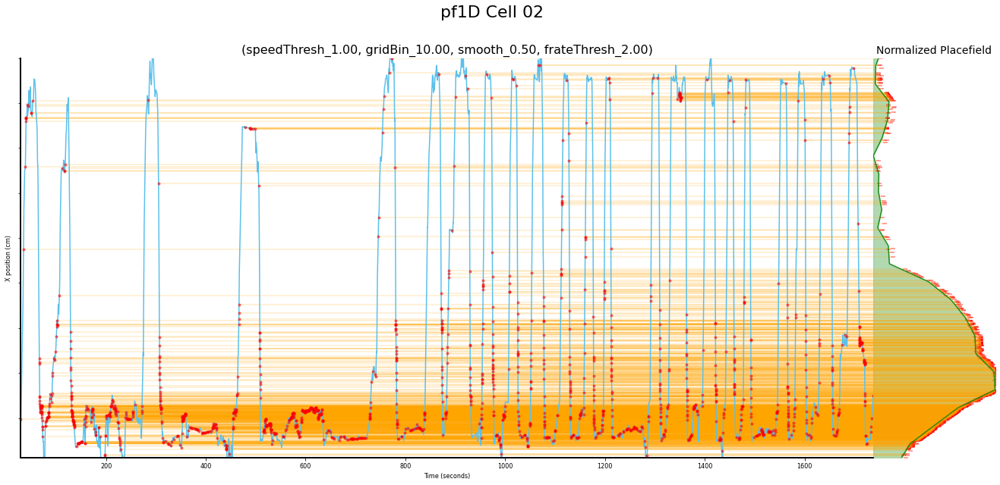

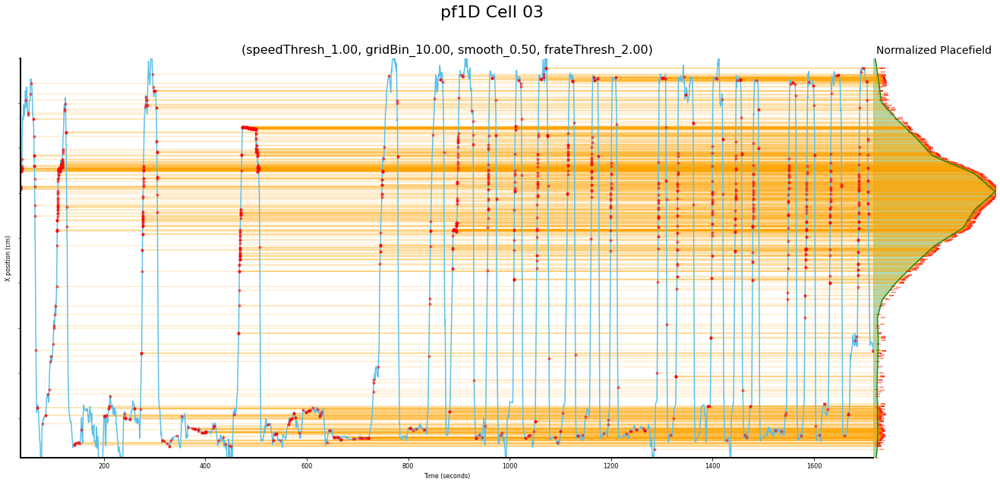

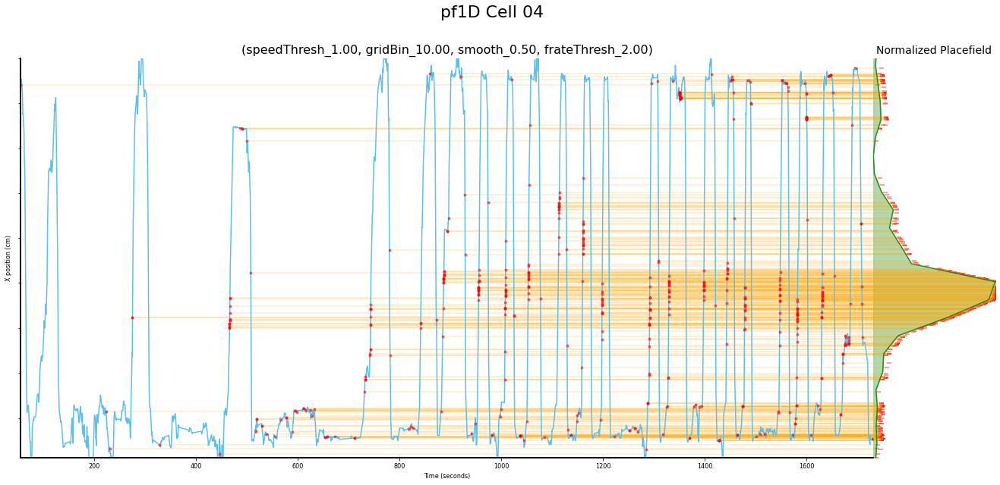

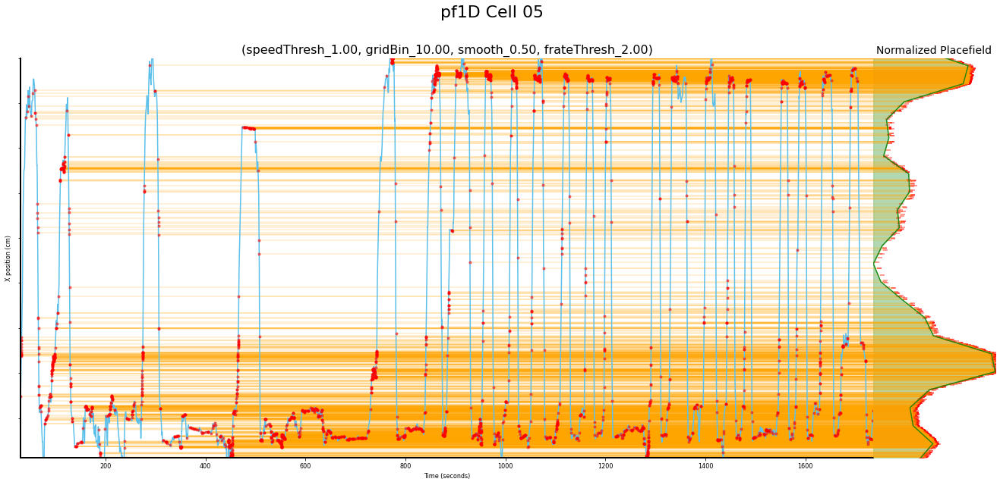

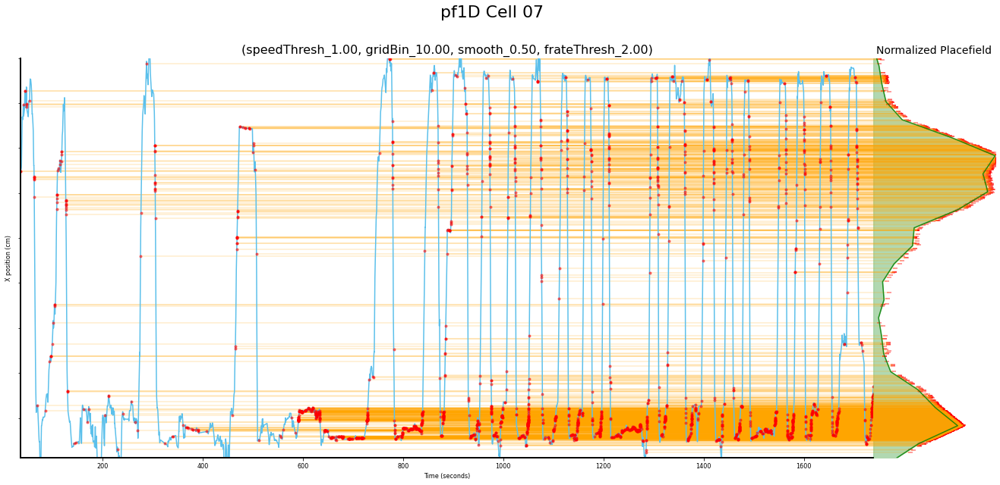

...

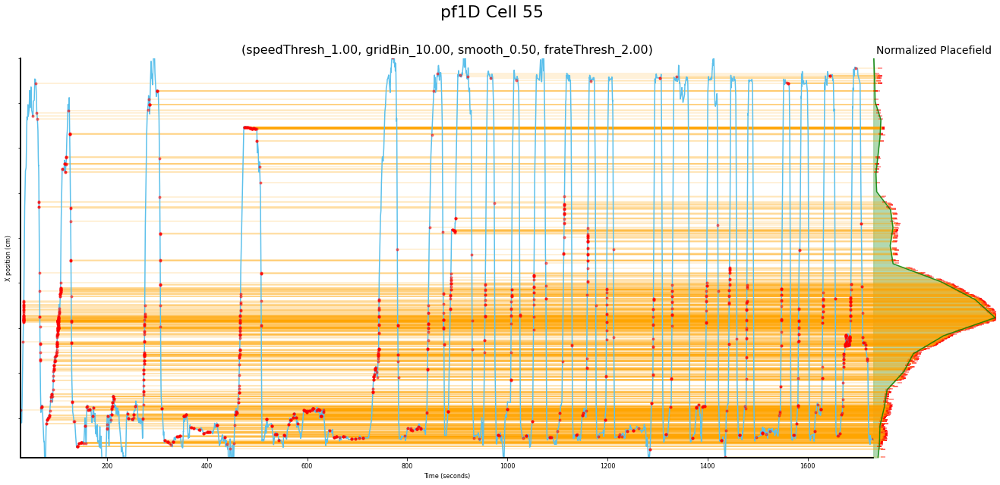

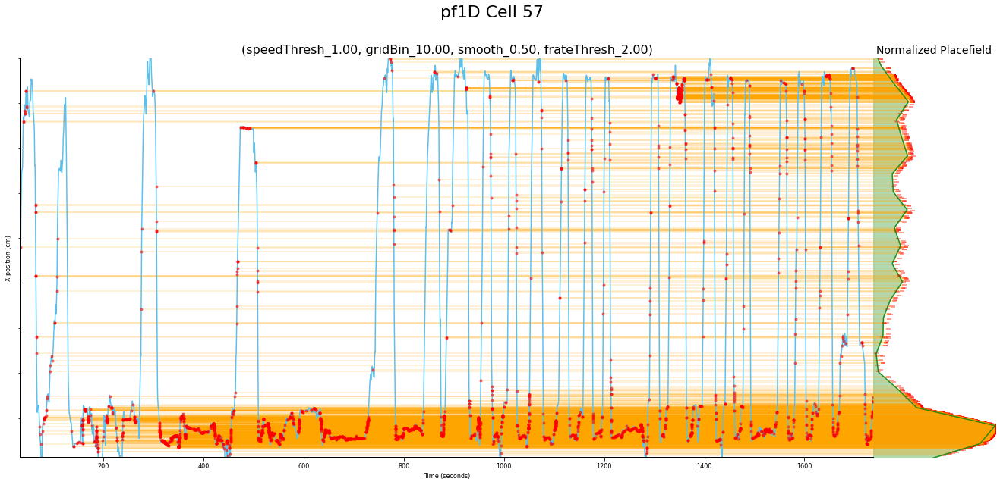

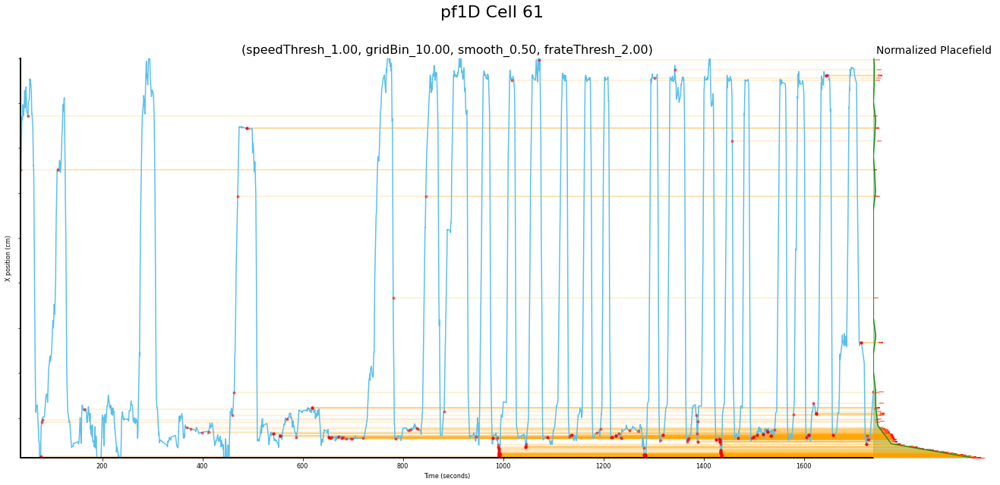

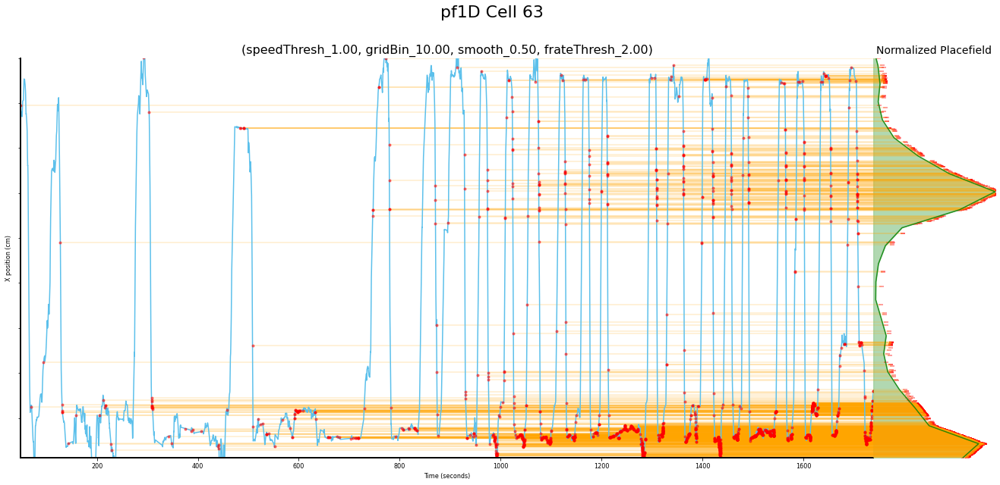

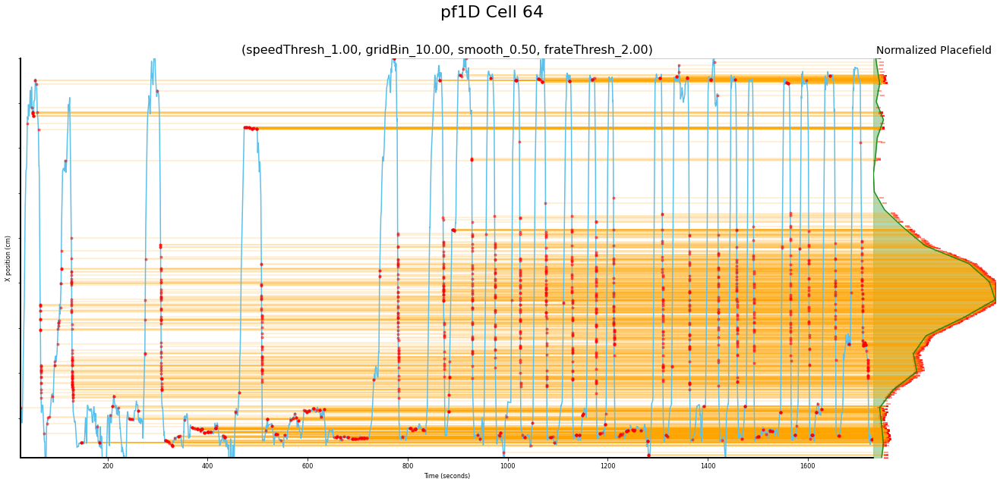

In [41]:
# import matplotlib as mpl
# mpl.rcParams.update(mpl.rcParamsDefault)
from PhoPositionalData.plotting.placefield import plot_1d_placecell_validations
# out_figures_list = plot_1d_placecell_validations(active_epoch_placefields1D, active_config.plotting_config, should_save=True, save_mode='pdf')
out_figures_list = plot_1d_placecell_validations(active_epoch_placefields1D, active_config.plotting_config, should_save=True, save_mode='separate_files')
# plot_1d_placecell_validations(active_epoch_placefields1D, active_config.plotting_config, modifier_string='lap_only', should_save=False)

In [15]:
# active_epoch_session.laps.to_dataframe()
def _compute_laps_position_data(session):
    curr_position_df = session.compute_position_laps()
    # adds a 'lap_dir' column, containing 0 if it's an outbound trial, 1 if it's an inbound trial, and -1 if it's neither.
    # curr_position_df['lap_dir'] = np.full_like(curr_position_df['lap'], -1)
    # curr_position_df.loc[np.logical_not(np.isnan(curr_position_df.lap.to_numpy())), 'lap_dir'] = np.mod(curr_position_df.loc[np.logical_not(np.isnan(curr_position_df.lap.to_numpy())), 'lap'], 2.0)
    lap_specific_position_dfs = [curr_position_df.groupby('lap').get_group(i)[['t','x','y','lin_pos','speed']] for i in session.laps.lap_id] # dataframes split for each ID:
    return curr_position_df, lap_specific_position_dfs


# def _plot_helper_add_lap_indicators_2d(sess):
    


laps_pos_df, lap_specific_position_dfs = _compute_laps_position_data(active_epoch_session)

curr_position_df = active_epoch_session.compute_position_laps()
print(laps_pos_df)

# laps_pos_df = laps_pos_df[laps_pos_df.lap != np.nan]
# laps_pos_df[laps_pos_df.lap == 1.0]

# valid_laps_indicies = np.where((laps_pos_df.lap.to_numpy() == 1.0))
# valid_laps_indicies = (laps_pos_df.lap.to_numpy() != 2.0)


valid_both_laps_indicies = np.logical_not(np.isnan(laps_pos_df.lap.to_numpy())) # all valid lap indicies
# valid_even_laps_indicies = (np.logical_or(valid_any_laps_indicies, (laps_pos_df.lap_dir.to_numpy() != 0)))
# valid_odd_laps_indicies = (np.logical_or(valid_any_laps_indicies, (laps_pos_df.lap_dir.to_numpy() != 1)))
# valid_even_laps_indicies = (np.logical_and(valid_both_laps_indicies, (laps_pos_df.lap_dir.to_numpy() == 0)))
# valid_odd_laps_indicies = (np.logical_and(valid_both_laps_indicies, (laps_pos_df.lap_dir.to_numpy() == 1)))

invalid_laps_indicies = (laps_pos_df.lap_dir.to_numpy() == -1)
valid_even_laps_indicies = (laps_pos_df.lap_dir.to_numpy() == 0)
valid_odd_laps_indicies = (laps_pos_df.lap_dir.to_numpy() == 1)

t_both = np.ma.masked_where(valid_both_laps_indicies, laps_pos_df.t.to_numpy())
x_both = np.ma.masked_where(valid_both_laps_indicies, laps_pos_df.x.to_numpy())
y_both = np.ma.masked_where(valid_both_laps_indicies, laps_pos_df.y.to_numpy())
# speed_both = np.ma.masked_where(valid_both_laps_indicies, laps_pos_df.speed.to_numpy())

t_even = np.ma.masked_where(valid_even_laps_indicies, laps_pos_df.t.to_numpy())
x_even = np.ma.masked_where(valid_even_laps_indicies, laps_pos_df.x.to_numpy())
y_even = np.ma.masked_where(valid_even_laps_indicies, laps_pos_df.y.to_numpy())

t_odd = np.ma.masked_where(valid_odd_laps_indicies, laps_pos_df.t.to_numpy())
x_odd = np.ma.masked_where(valid_odd_laps_indicies, laps_pos_df.x.to_numpy())
y_odd = np.ma.masked_where(valid_odd_laps_indicies, laps_pos_df.y.to_numpy())

# plt.plot(t1, x1)

KeyError: 43

In [ ]:
### TODO: attempt to filter the active_epoch_session's lap ID's by the dataframe
# curr_position_df = active_epoch_session.compute_position_laps()
# lap_id_is_included = (curr_position_df.groupby('lap')['lap'].agg(['value_counts']).to_numpy() > 0)
# lap_id_is_included

NameError: name 't_even' is not defined

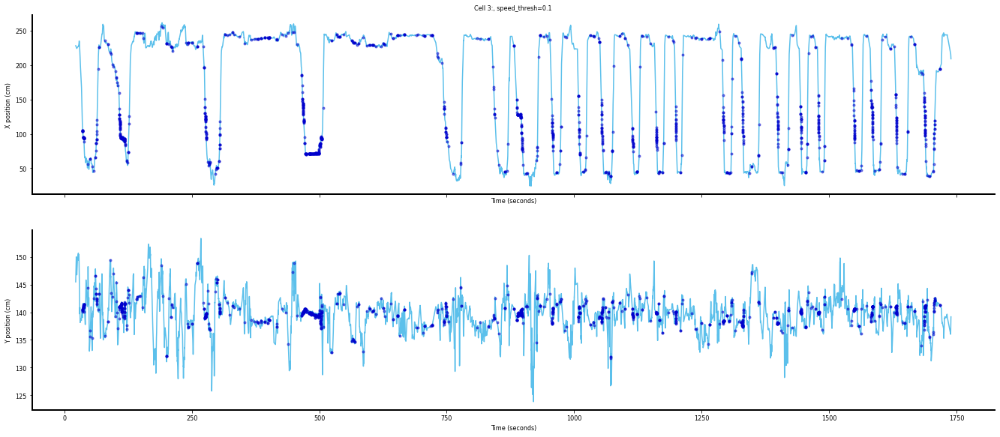

In [16]:
# active_epoch_placefields2D.plotRaw()
curr_cell_id = 1
fig, ax = active_epoch_placefields2D.plotRaw_v_time(curr_cell_id)
# ax[0].plot(t_both, x_both, 'k', alpha=0.8, linewidth=5)
ax[0].plot(t_even, x_even, 'g', alpha=0.3, linewidth=3)
ax[0].plot(t_odd, x_odd, 'r', alpha=0.3, linewidth=3)

In [ ]:
plt.figure(figsize=(24.0, 4.0))
plt.plot(active_epoch_session.position.time, active_epoch_session.position.speed)
# plt.plot
# active_epoch_placefields2D.t
# active_epoch_placefields2D.x
# plt.gca()
# np.isin(active_epoch_placefields2D.t, 
# y3 = np.ma.masked_where(y > 0.7, y)

([<Figure size 864x1440 with 36 Axes>], [GridSpec(10, 8)])

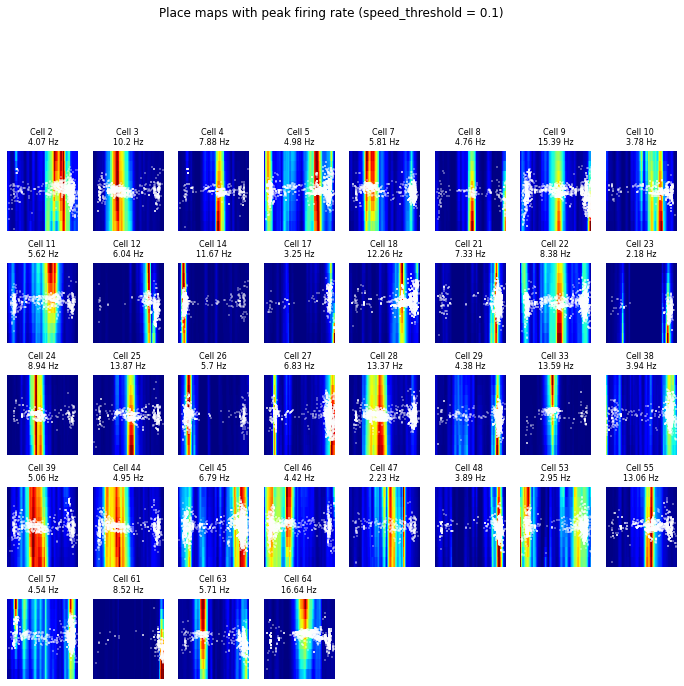

In [17]:
active_epoch_placefields2D.plotMap(figsize=(12,20), enable_spike_overlay=True)

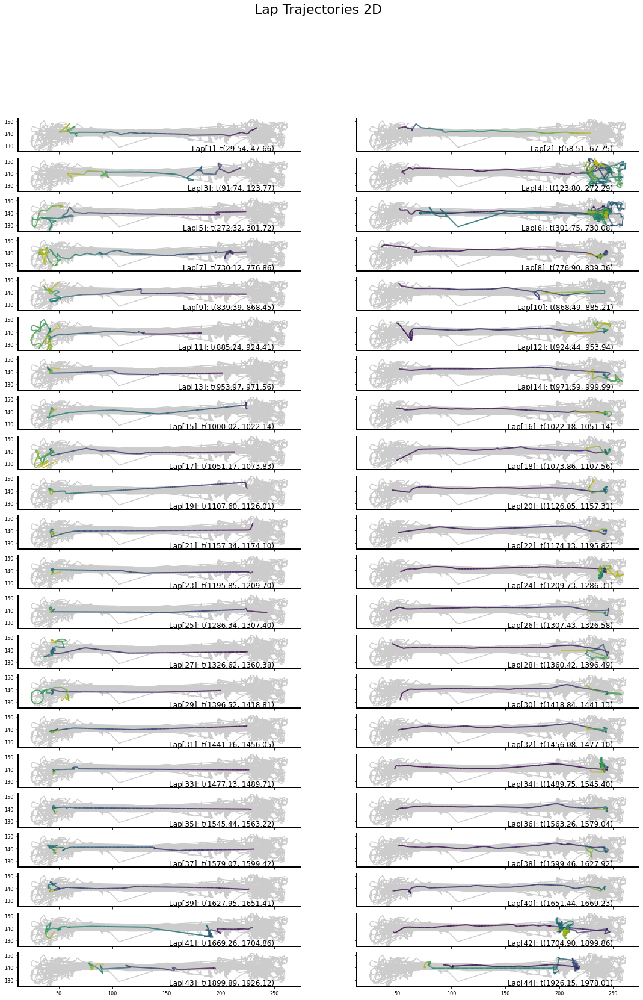

In [18]:
from PhoPositionalData.plotting.laps import plot_lap_trajectories_2d
fig, axs, laps_pages = plot_lap_trajectories_2d(sess, curr_num_subplots=len(sess.laps.lap_id), active_page_index=0)
fig.suptitle('Lap Trajectories 2D', fontsize=22)
# fig_out_path = active_config.plotting_config.get_figure_save_path('lap_trajectories_2D').with_suffix('.png')
# fig.savefig(fig_out_path)
plt.show()

# p, axs, laps_pages = plot_lap_trajectories_2d(sess, curr_num_subplots=22, active_page_index=0)
# p, axs, laps_pages = plot_lap_trajectories_2d(sess, curr_num_subplots=22, active_page_index=1)

# 3D Plots

### 3D Lap Trajectories Visualization:

In [ ]:
from PhoPositionalData.plotting.laps import plot_lap_trajectories_3d
p, laps_pages = plot_lap_trajectories_3d(sess, curr_num_subplots=10, active_page_index=1)
p.show()

## Tuning Curves 3D Plot:

In [ ]:
from pyphoplacecellanalysis.GUI.PyVista.InteractivePlotter.InteractivePlaceCellTuningCurvesDataExplorer import InteractivePlaceCellTuningCurvesDataExplorer
try: pActiveTuningCurvesPlotter
except NameError: pActiveTuningCurvesPlotter = None # Checks variable p's existance, and sets its value to None if it doesn't exist so it can be checked in the next step
ipcDataExplorer = InteractivePlaceCellTuningCurvesDataExplorer(active_config, active_epoch_session, active_epoch_placefields, active_config.plotting_config.pf_colors, extant_plotter=pActiveTuningCurvesPlotter)
pActiveTuningCurvesPlotter = ipcDataExplorer.plot(pActiveTuningCurvesPlotter) # [2, 17449]

### Tuning-Curve Height Spikes Plot Testing:

C:\Users\Pho\repos\NeuroPy\neuropy\utils\mathutil.py:23: RuntimeWarning: invalid value encountered in true_divide
  return (x - np.min(x, axis=axis, keepdims=True)) / np.ptp(


np.shape(spike_pf_heights_2D): (809,)


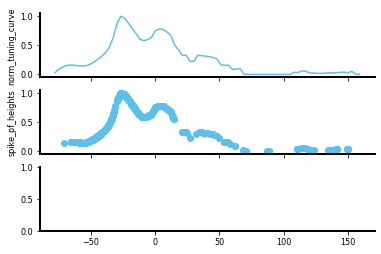

In [115]:
from matplotlib.collections import EventCollection
from scipy.interpolate import RectBivariateSpline # for 2D spline interpolation

## Getting the proper z-position for the tuning curve:
# Create source to ray trace
sphere = pv.Sphere(radius=0.85)

# Define a list of origin points and a list of direction vectors for each ray
# vectors = [ [cos(radians(x)), sin(radians(x)), 0] for x in range(0, 360, 5)]

# origins = [[0, 0, 0]] * len(active_lap_specific_epoch_session.spikes_df['x'])
# origins = np.hstack(active_lap_specific_epoch_session.spikes_df[['x','y']].to_numpy().T, np.full_like(active_lap_specific_epoch_session.spikes_df['x'].to_numpy(), 0.0))
# origins[0,:]
# spike_series_identities = active_flattened_spike_identities # currently unused

active_epoch_placefields2D


active_epoch_placefields1D.ratemap_spiketrains # times where the spikes occured.
active_epoch_placefields1D.ratemap_spiketrains_pos # position where the spikes occured.



# np.interp(active_epoch_placefields1D.ratemap_spiketrains_pos, active_epoch_placefields1D.ratemap.xbin_centers, active_epoch_placefields1D.ratemap.normalized_tuning_curves)



## This is the correct 1D interpolation! It gets the y-values on the curve where the spikes could be plot!
spike_pf_heights_1D = [np.interp(active_epoch_placefields1D.spk_pos[i], active_epoch_placefields1D.ratemap.xbin_centers, active_epoch_placefields1D.ratemap.normalized_tuning_curves[i]) for i in np.arange(active_epoch_placefields1D.ratemap.n_neurons)] # the appropriately interpolated values for where the spikes should be on the tuning_curve


## Potentially successfully implemented the z-interpolation!!!: 2D interpolation where the (x,y) point of each spike is evaluated to determine the Z-position it would correspond to on the pf map.
_spike_pf_heights_2D_splineAproximator = [RectBivariateSpline(active_epoch_placefields2D.ratemap.xbin_centers, active_epoch_placefields2D.ratemap.ybin_centers, active_epoch_placefields2D.ratemap.normalized_tuning_curves[i]) for i in np.arange(active_epoch_placefields2D.ratemap.n_neurons)] 
spike_pf_heights_2D = [spike_pf_heights_2D_splineAproximator[i](active_epoch_placefields2D.spk_pos[i][0], active_epoch_placefields2D.spk_pos[i][1], grid=False) for i in np.arange(active_epoch_placefields1D.ratemap.n_neurons)] # the appropriately interpolated values for where the spikes should be on the tuning_curve
print(f'np.shape(spike_pf_heights_2D): {np.shape(spike_pf_heights_2D[i])}') # (809,)

# spike_pf_heights_2D_x = [np.interp(active_epoch_placefields1D.spk_pos[i], active_epoch_placefields2D.ratemap.xbin_centers, active_epoch_placefields1D.ratemap.normalized_tuning_curves[i]) for i in np.arange(active_epoch_placefields1D.ratemap.n_neurons)] # the appropriately interpolated values for where the spikes should be on the tuning_curve
# spike_pf_heights_2D_y = [np.interp(active_epoch_placefields1D.spk_pos[i], active_epoch_placefields1D.ratemap.xbin_centers, active_epoch_placefields1D.ratemap.normalized_tuning_curves[i]) for i in np.arange(active_epoch_placefields1D.ratemap.n_neurons)] # the appropriately interpolated values for where the spikes should be on the tuning_curve



# np.inter

# active_epoch_placefields2D.ratemap.normalized_tuning_curves[i]





#spike_pf_heights_1D is (814,) and the values range between 0.0 and 1.0

fig = plt.Figure()
axes = fig.subplots(3, 1, sharex=True)
axes[0].plot(active_epoch_placefields1D.ratemap.xbin_centers, active_epoch_placefields1D.ratemap.normalized_tuning_curves[i])
axes[0].set_ylabel('norm_tuning_curve')
# axes[0].plot(active_epoch_placefields1D.ratemap.xbin_centers, active_epoch_placefields1D.ratemap.normalized_tuning_curves[i])
# plt.plot(active_epoch_placefields1D.spk_pos[i])
# plt.plot(active_epoch_placefields1D.spk_t[i], spike_pf_heights_1D[i])

axes[1].scatter(active_epoch_placefields1D.spk_pos[i], spike_pf_heights_1D[i])
axes[1].set_ylabel('spike_pf_heights')

# # create the events marking the x data points
# xevents1 = EventCollection(xdata1, color='tab:blue', linelength=0.05)
# xevents2 = EventCollection(xdata2, color='tab:orange', linelength=0.05)

# # create the events marking the y data points
# yevents1 = EventCollection(ydata1, color='tab:blue', linelength=0.05,
#                            orientation='vertical')
# yevents2 = EventCollection(ydata2, color='tab:orange', linelength=0.05,
#                            orientation='vertical')

# # add the events to the axis
# ax.add_collection(xevents1)
# ax.add_collection(xevents2)
# ax.add_collection(yevents1)
# ax.add_collection(yevents2)

fig

In [ ]:
active_epoch_session.position



vectors = [[0, 0, 10.0]] * len(active_lap_specific_epoch_session.spikes_df['x']) # just up in the z-direction
spike_series_positions = active_lap_specific_epoch_session.spikes_df[['x','y']].to_numpy().T    
z_fixed = np.full_like(spike_series_positions[0,:], 1.1) # Offset a little bit in the z-direction so we can see it
origins = np.vstack((spike_series_positions[0,:], spike_series_positions[1,:], z_fixed)).T
# origins

# Perform ray trace
# Define line segment
# start = [0, 0, 0]
# stop = [0.25, 1, 0.5]

curr_idx = 0
curr_tuning_curve_mesh = ipcDataExplorer.plots['tuningCurvePlotActors'][curr_idx]
start = origins[curr_idx]
stop = start + vectors[curr_idx]

# Perform ray trace
# points, ind = sphere.ray_trace(start, stop)
points, ind = curr_tuning_curve_mesh.ray_trace(start, stop)
pActiveTuningCurvesPlotter.add_mesh(ray, color="blue", line_width=5, name='test_ray', label="Ray Segment")
pActiveTuningCurvesPlotter.add_mesh(intersection, color="maroon",
           point_size=25, label="Intersection Points", name='test_ray_intersection')
# points, ind_ray, ind_tri = sphere.multi_ray_trace(origins, vectors)

## Interactive 3D Spike and Behavior Browser: 

In [116]:
import PhoGui
from pyphoplacecellanalysis.GUI.PyVista.InteractivePlotter.PhoInteractivePlotter import PhoInteractivePlotter
from pyphoplacecellanalysis.GUI.PyVista.InteractivePlotter.shared_helpers import InteractivePyvistaPlotterBuildIfNeededMixin
from pyphoplacecellanalysis.GUI.PyVista.InteractivePlotter.InteractivePlaceCellDataExplorer import InteractivePlaceCellDataExplorer

active_config.plotting_config.show_legend = True

try: pActiveInteractivePlaceSpikesPlotter
except NameError: pActiveInteractivePlaceSpikesPlotter = None # Checks variable p's existance, and sets its value to None if it doesn't exist so it can be checked in the next step
ipspikesDataExplorer = InteractivePlaceCellDataExplorer(active_config, active_epoch_session, extant_plotter=pActiveInteractivePlaceSpikesPlotter)
pActiveInteractivePlaceSpikesPlotter = ipspikesDataExplorer.plot(pActivePlotter=pActiveInteractivePlaceSpikesPlotter)

active_epoch_pos.sampling_rate (Hz): 29.96976228983933
longer_spikes_window - curr_view_window_length_samples - 30689
recent_spikes_window - curr_view_window_length_samples - 299
Applying custom Pyvista theme.
done.
No extant BackgroundPlotter
Creating a new BackgroundPlotter
[f] - Focus and zoom in on the last clicked point
shift+click - Drag to pan the rendering scene
ctrl+click - Rotate the scene in 2D


## CustomDataExplorer 3D Plotter:

In [ ]:
from pyphoplacecellanalysis.GUI.PyVista.InteractivePlotter.InteractiveCustomDataExplorer import InteractiveCustomDataExplorer
active_laps_config = InteractivePlaceCellConfig(active_session_config=sess.config, active_epochs=None, video_output_config=None, plotting_config=None) # '3|1    
active_laps_config.plotting_config = PlottingConfig(output_subplots_shape='1|5', output_parent_dir=Path('output', sess.config.session_name, 'custom_laps'))

try: pActiveInteractiveLapsPlotter
except NameError: pActiveInteractiveLapsPlotter = None # Checks variable p's existance, and sets its value to None if it doesn't exist so it can be checked in the next step
iplapsDataExplorer = InteractiveCustomDataExplorer(active_laps_config, sess, extant_plotter=pActiveInteractiveLapsPlotter)
pActiveInteractiveLapsPlotter = iplapsDataExplorer.plot(pActivePlotter=pActiveInteractiveLapsPlotter)

In [ ]:
# surf = points.reconstruct_surface()

def perform_plot_flat_arena(p, x, y, bShowSequenceTraversalGradient=False):
    # Call with:
    # pdata_maze, pc_maze = build_flat_map_plot_data() # Plot the flat arena
    # p.add_mesh(pc_maze, name='maze_bg', color="black", render=False)
    def __build_flat_map_plot_data(x, y):
        # Builds the flat base maze map that the other data will be plot on top of
        ## Implicitly relies on: x, y
        z = np.zeros_like(x)
        point_cloud = np.vstack((x, y, z)).T
        pdata = pv.PolyData(point_cloud)
        pdata['occupancy heatmap'] = np.arange(np.shape(point_cloud)[0])
        geo = pv.Circle(radius=0.5)
        pc = pdata.glyph(scale=False, geom=geo)
        return pdata, pc

    pdata_maze, pc_maze = __build_flat_map_plot_data(x, y)
    surf = pdata_maze.reconstruct_surface()
    
    return p.add_mesh(pc_maze, name='maze_bg', label='maze', color="black", render=True)    
    # # bShowSequenceTraversalGradient
    # if bShowSequenceTraversalGradient:
    #     traversal_order_scalars = np.arange(len(x))
    #     return p.add_mesh(pc_maze, name='maze_bg', label='maze', scalars=traversal_order_scalars, render=True)

iplapsDataExplorer.plots['maze_bg'] = perform_plot_flat_arena(pActiveInteractiveLapsPlotter, iplapsDataExplorer.x, iplapsDataExplorer.y)



In [ ]:
len(sess.laps.lap_id) # 44

In [ ]:
for i in np.arange(len(sess.laps.lap_id)):
    curr_lap_id = sess.laps.lap_id[i]
    curr_lap_t_start, curr_lap_t_stop = sess.laps.get_lap_times(i)
    curr_lap_position_traces = laps_position_traces[i]
    plot_lap_trajectory_path_spline(iplapsDataExplorer, curr_lap_position_traces, curr_lap_id)

In [ ]:
# p = pv.Plotter(shape=(5, 1), border=True)
p = pActiveInteractiveLapsPlotter
num_laps_to_show = len(sess.laps.lap_id)
num_laps_to_show = 5
flat_lap_id_index = np.arange(len(sess.laps.lap_id))
# subplot_lap_id_index = np.reshape([4,11])
for i in np.arange(num_laps_to_show):
    curr_lap_id = sess.laps.lap_id[i]
    p.subplot(i, 0)
    # curr_lap_t_start, curr_lap_t_stop = sess.laps.get_lap_times(i)
    plot_lap_trajectory_path_spline(iplapsDataExplorer, laps_position_traces[i], curr_lap_id)
    
p.link_views()  # link all the views
p.show()

In [ ]:
# ipspikesDataExplorer.spikes_main_historical.SetVisibility(0)

# ipspikesDataExplorer.spikes_main_historical.SetVisibility(1)
# bool(ipspikesDataExplorer.spikes_main_historical.GetVisibility())

ipspikesDataExplorer.toggle_plot_visibility('spikes_main_historical')
# toggle_visibility(ipspikesDataExplorer.spikes_main_historical)

In [ ]:
ipspikesDataExplorer.toggle_plot_visibility('lap_location_trail')

In [ ]:
# ipspikesDataExplorer.spikes_main_recent_only.SetVisibility(True)
toggle_visibility(ipspikesDataExplorer.spikes_main_recent_only)

In [ ]:
# ipspikesDataExplorer.animal_location_trail.SetVisibility(0)
# toggle_visibility(ipspikesDataExplorer.animal_location_trail)
ipspikesDataExplorer.toggle_plot_visibility('animal_location_trail')
ipspikesDataExplorer.toggle_plot_visibility('animal_current_location_point')

## Debugging Index Issues:

In [ ]:
# def plot_placefields2D(pTuningCurves, active_placefields, pf_colors: np.ndarray, zScalingFactor=10.0, show_legend=False):

#     # .threshold().elevation()

#     curr_tuning_curves = active_placefields.ratemap.normalized_tuning_curves
#     # curr_tuning_curves[curr_tuning_curves < 0.1] = np.nan
#     curr_tuning_curves = curr_tuning_curves * zScalingFactor

#     num_curr_tuning_curves = len(curr_tuning_curves)
#     # Get the cell IDs that have a good place field mapping:
#     good_placefield_neuronIDs = np.array(active_placefields.ratemap.neuron_ids) # in order of ascending ID
#     tuningCurvePlot_x, tuningCurvePlot_y = np.meshgrid(active_placefields.ratemap.xbin_centers, active_placefields.ratemap.ybin_centers)

#     pdata_currActiveNeuronTuningCurve = pv.StructuredGrid(tuningCurvePlot_x, tuningCurvePlot_y, curr_active_neuron_tuning_Curve)
#     pdata_currActiveNeuronTuningCurve["Elevation"] = curr_active_neuron_tuning_Curve.ravel(order="F")
        
#     return pTuningCurves

# plot_placefields2D(pTuningCurves, active_epoch_placefields

# ipcDataExplorer.plots['spikes_pf_active']['cellID']

# only_active_colormap = ipcDataExplorer.active_config.plotting_config.active_cells_listed_colormap.copy()
# only_active_colormap
test_full_pc_data = ipcDataExplorer.plots_data['spikes_pf_active']['historical_spikes_pc']

# test_subset = test_full_pc_data.GetCellGhostArray()
# test_subset = test_full_pc_data.GetCellData() # vtkmodules.vtkCommonDataModel.vtkCellData
# test_subset = test_full_pc_data[test_full_pc_data['cellID'] == 55] # vtkmodules.vtkCommonDataModel.vtkCellData

# test_subset = test_full_pc_data.GetGhostArray() # [test_full_pc_data['cellID'] == 55] # vtkmodules.vtkCommonDataModel.vtkCellData


unique_ids = np.unique(test_full_pc_data['cellID']) # array([ 0,  1,  2,  3,  5,  7,  9, 10, 15, 16, 19, 20, 21, 22, 25, 26, 27, 31, 32, 36, 37, 40, 42, 43, 44, 45, 46, 51, 53, 55, 56])
# count_arr = np.bincount(test_full_pc_data['cellID'])
count_arr
# array([ 3591,  3311,   231,  4410,     0,   910,     0,  4417,     0,
#         1050,  2443,     0,     0,     0,     0,  2156,  6664,     0,
#            0, 10052,  6286,  2394,  1561,     0,     0,  8827,  4788,
#         6412,     0,     0,     0,   959,  2051,     0,     0,     0,
#         4809,  2758,     0,     0,  1575,     0,  3465, 14861,  2212,
#          777,  2772,     0,     0,     0,     0,  3206,     0,  4032,
#            0,  6489,  2674], dtype=int64)

# good_placefield_neuronIDs: [  5   8  10  13  14  16  19  21  23  25  28  31  32  33  36  37  41  49
#   52  53  54  55  57  59  60  61  62  63  64  66  68  69  74  75  76  78
#   83  86  88  89  90  92  96  98 105 108]; (46 good)

# 1, 4, 6, 7, 8, 11, 18, 19, 21 ## CONCLUSION: the ones that work are indeed the non-zero entries, but the checkboxes work in reverse order to this array that's printed. Meaning you start at the end and work back.
# len(count_arr) # 107
print(unique_ids) # [  3   6   8  11  12  14  17  19  21  23  26  29  30  31  34  35  39  47
  # 50  51  52  53  55  57  58  59  60  61  62  64  66  67  72  73  74  76
  # 81  84  86  87  88  90  94  96 103 106]


# uniques, indicies, inverse_indicies, count_arr = np.unique(active_epoch_session.spikes_df['aclu'].values, return_index=True, return_inverse=True, return_counts=True)
# # count_arr = np.bincount(active_epoch_session.spikes_df['aclu'].values)
# print('active_epoch_session.spikes_df unique aclu values: {}'.format(uniques))
# print('active_epoch_session.spikes_df unique aclu value counts: {}'.format(count_arr))
# print(len(uniques)) # 46 
# uniques, indicies, inverse_indicies, count_arr = np.unique(active_epoch_session.spikes_df['unit_id'].values, return_index=True, return_inverse=True, return_counts=True)
# # count_arr = np.bincount(active_epoch_session.spikes_df['unit_id'].values)
# print('active_epoch_session.spikes_df unique unit_id values: {}'.format(uniques))
# print('active_epoch_session.spikes_df unique unit_id value counts: {}'.format(count_arr))
# print(len(uniques)) # 46 

In [ ]:
# pActiveTuningCurvesPlotter.export_obj('export.obj')
# pActiveTuningCurvesPlotter.export_gltf('export.gltf')

ipcDataExplorer.update_placefield_spike_visibility([38], True) # seems to work

In [ ]:
ipcDataExplorer.update_placefield_spike_visibility([53], True) # seems to work

In [ ]:
ipcDataExplorer.update_placefield_spike_visibility([44, 53], True) # seems to work

# test_subset
# test_subset

In [ ]:
ipcDataExplorer.update_placefield_spike_visibility([53, 44], False) # seems to work

In [ ]:
ipcDataExplorer.gui['tuningCurveSpikeVisibilityCallbacks'][1](False)
# ipcDataExplorer.get_cell_index([2, 3])

In [ ]:
mesh = ipcDataExplorer.plots_data['spikes_pf_active']['historical_spikes_pc'].cast_to_unstructured_grid()
# mesh.n_cells
mesh_unique_ids = np.unique(mesh['cellID'])
print('n_cells: {}'.format(mesh.n_cells)) # 122143
print('cellIDs of mesh: {}'.format(mesh_unique_ids))
# np.unique(mesh['cellID']) # array([ 0,  1,  2,  3,  5,  7,  9, 10, 15, 16, 19, 20, 21, 22, 25, 26, 27, 31, 32, 36, 37, 40, 42, 43, 44, 45, 46, 51, 53, 55, 56])
# ipcDataExplorer.hide_placefield_spikes([0,1,2,3], should_invert=True)
# ipcDataExplorer.hide_placefield_spikes([23,2,34], should_invert=True)

# ipcDataExplorer.hide_placefield_spikes([34], should_invert=True)
ipcDataExplorer.hide_placefield_spikes([38], should_invert=False)

In [ ]:
# the list of spike times that occured for this cell:
i = 2
active_epoch_session.neurons.neuron_ids[i]
active_epoch_session.neurons.spiketrains[i]

# spikes_df = FlattenedSpiketrains.build_spike_dataframe(sess)


In [ ]:
## Timestamp Fixing:
def tt(position_timestamps, t_begin, SampleRate):
    return ((position_timestamps - t_begin) / (1e6 * SampleRate))

# sess.laps.lap_start_stop_flat_idx

sess.recinfo.dat_sampling_rate


# Programmatically change the animal position trail:

In [91]:
def get_lap_position(curr_lap_id):
    curr_position_df = sess.position.to_dataframe()
    curr_lap_t_start, curr_lap_t_stop = get_lap_times(curr_lap_id)
    print('lap[{}]: ({}, {}): '.format(curr_lap_id, curr_lap_t_start, curr_lap_t_stop))

    curr_lap_position_df_is_included = curr_position_df['t'].between(curr_lap_t_start, curr_lap_t_stop, inclusive=True) # returns a boolean array indicating inclusion in teh current lap
    curr_lap_position_df = curr_position_df[curr_lap_position_df_is_included] 
    # curr_position_df.query('-0.5 <= t < 0.5')
    curr_lap_position_traces = curr_lap_position_df[['x','y']].to_numpy().T
    print('\t {} positions.'.format(np.shape(curr_lap_position_traces)))
    # print('\t {} spikes.'.format(curr_lap_num_spikes))
    return curr_lap_position_traces

# ipspikesDataExplorer.on_programmatic_data_update(active_included_all_historical_indicies=curr_lap_spike_indicies, active_included_recent_only_indicies=curr_lap_spike_indicies) # index 145937 is out of bounds for axis 0 with size 19647
# ipspikesDataExplorer.on_programmatic_data_update(active_included_all_historical_indicies=curr_lap_spike_t_seconds, active_included_recent_only_indicies=curr_lap_spike_t_seconds) # 
# ipspikesDataExplorer.on_programmatic_data_update(active_included_all_historical_indicies=curr_lap_spike_t_seconds.values, active_included_recent_only_indicies=curr_lap_spike_t_seconds.values) # 

curr_lap_id = int_input.value

# plot_lap_trajectory_path(ipspikesDataExplorer, curr_lap_position_traces)
plot_lap_trajectory_path_spline(ipspikesDataExplorer, curr_lap_position_traces)
# curr_lap_t_start
## TODO: enable showing/hiding the spikes for this data range programmatically in InteractivePlaceCellDataExplorer. 
# ipspikesDataExplorer.
# curr_lap_spike_t_seconds
# curr_lap_spike_indicies
# active_epoch_session.flattened_spiketrains.spikes_df.t_seconds.values[curr_lap_spike_indicies] # index 145937 is out of bounds for axis 0 with size 19647

NameError: name 'int_input' is not defined

In [ ]:
# From the laps and position dataframe, extract which lap every position belongs to:

# curr_lap_position_df_is_included = curr_position_df['t'].between(laps_df['start'], laps_df['stop'], inclusive=True) # returns a boolean array indicating inclusion in teh current lap
# curr_lap_position_df = curr_position_df[curr_lap_position_df_is_included] 
# curr_position_df['lap'] = np.NaN

curr_position_df = sess.compute_position_laps()
# curr_position_df.groupby('lap').groups[1] # returns the Int64Index
# curr_position_df.groupby('lap').get_group(2)[['t','x','y','lin_pos']]

lap_specific_position_dfs = [curr_position_df.groupby('lap').get_group(i)[['t','x','y','lin_pos']] for i in sess.laps.lap_id]
lap_specific_position_dfs
curr_lap_position_traces = [lap_pos_df[['x','y']].to_numpy().T for lap_pos_df in lap_specific_position_dfs]
curr_lap_position_traces
curr_lap_time_range = [[lap_pos_df[['t']].to_numpy()[0].item(), lap_pos_df[['t']].to_numpy()[-1].item()] for lap_pos_df in lap_specific_position_dfs]
curr_lap_time_range

# Programmatically change the animals location point indicator:

In [ ]:
# .GetPosition() returns the actor's position, which is usually (0.0, 0.0, 0.0), and does not relate to the actor's data points
# curr_animal_point = ipspikesDataExplorer.animal_location_trail.GetPosition()
# curr_animal_point = ipspikesDataExplorer.animal_location_trail.GetXRange() # (44.23604202270508, 245.9059600830078)
# print(curr_animal_point)
# curr_animal_point = ipspikesDataExplorer.animal_location_trail.GetYRange() # (135.27638244628906, 145.448974609375)
# print(curr_animal_point)
# curr_animal_point = ipspikesDataExplorer.animal_location_trail.GetZRange() # (1.100000023841858, 1.100000023841858)

curr_animal_point = np.array(ipspikesDataExplorer.animal_location_trail.GetCenter()) # (206.27755737304688, 140.15452575683594, 1.100000023841858)
print('curr_animal_point: {}'.format(curr_animal_point))
curr_animal_point # curr_animal_poin

# curr_animal_point = np.array([0, 0, 0])

# curr_animal_point = np.column_stack((self.x[active_window_sample_indicies], self.y[active_window_sample_indicies], self.z_fixed))
# ipspikesDataExplorer.on_programmatic_data_update(curr_animal_point=curr_animal_point)

curr_debug_point = np.array(ipspikesDataExplorer.animal_location_trail.GetCenter()) # (206.27755737304688, 140.15452575683594, 1.100000023841858)
ipspikesDataExplorer.perform_plot_location_point('debug_point_plot', curr_animal_point, color='r')

curr_animal_point = np.array(ipspikesDataExplorer.animal_location_trail.GetCenter()) # not updated
print('new curr_animal_point: {}'.format(curr_animal_point))

In [ ]:
# ipspikesDataExplorer.flattened_spike_positions_list

active_epoch_session.flattened_spiketrains.time_slice(curr_lap_spike_t_seconds.values[0], curr_lap_spike_t_seconds.values[-1]).spikes_df

In [ ]:
curr_lap_dataframe

In [ ]:
active_epoch_session.time_slice

In [ ]:
# Main Track Barrier Parts:
[63.5, 138.6] # bottom-left edge of the left-most track/platform barrier
[63.5, 144.2] # top-left edge of the left-most track/platform barrier
[223.9, 137.4] # bottom-right edge of the right-most track/platform barrier
[223.9, 150.0] # top-right edge of the right-most track/platform barrier



In [ ]:
## Adding interaction highlighters:
pActiveInteractivePlaceSpikesPlotter.